## STACKOVERFLOW 2019 SURVEY DATA ANALYSIS

### TABLE OF CONTENTS

1. Load Survey Data and Explore Areas of Interest
2. General Data Understanding
3. Question 1 - How many Data Scientists were in the dataset and where are they?
4. Question 2 - What is the education level and other qualifications of Data Scientists?
5. Question 3 - How many Data Scientists are only starting out in the field?
6. Question 4 - What are the most common programming languages Data Scientists work with?
7. Question 5 - How much Remote work do Data Scientists do?
8. Question 6 - Where to find the best jobs?
9. Question 7 - How Optimistic are Data Scientists about the future?
10. Question 8 - What is the nature of Data Scientists Employment?
11. Modeling

In [1]:
# Read in the relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
#sns.set_style('darkgrid')
sns.set_palette("bright", 10)
import glob
import os.path
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from wordcloud import WordCloud
from collections import defaultdict

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

fs= 10

In [2]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier

# from sklearn.feature_selection import SelectFromModel
# from lightgbm import LGBMClassifier

from sklearn.ensemble import ExtraTreesClassifier

## LOAD SURVEY DATA AND EXPLORE AREAS OF INTEREST


### We will be using the Stack Overflow survey data for the 2019

In [3]:
# path = r'C:\Users\max\documents\udacity\stackoverflow_survey\survey'                     # use your path
# survey_files = glob.glob(os.path.join(path, "*.csv"))     # advisable to use os.path.join as this makes concatenation OS independent

# df_from_each_file = (pd.read_csv(f) for f in survey_files)
# survey_df   = pd.concat(df_from_each_file, ignore_index=False, sort=True, keys =['2017', '2018', '2019'], names=['Year'])

In [4]:
# first_year = 2017
# last_year = 2019

# import_list = range(first_year, last_year+1)
# dfs = {}
# schemas = {}

# for year in import_list:
#     dfs[str(year)], schemas[str(year)] = \
#         af.StackOverflow_dataset_import("Project files", year)

In [5]:
# data_sets = ('2017_survey.csv', '2017_schema.csv', '2018_survey.csv', '2018 _schema.csv', '2019_survey.csv', '2019_schema.csv')
# dfs = []
# for data in data_sets:
#     df = pd.read_csv(data)
#     dfs.append(df)

In [6]:
# Load Data 2019 stackoverflow data
df = pd.read_csv('2019_survey.csv')
schema = pd.read_csv('2019_schema.csv')

In [7]:
# Make a copy of the data
df2 = df.copy()

### DATA UNDERSTANDING
### Lets get familiar with the data

In [8]:
# View first few rows of the data
df.head(3)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase
0,1,I am a student who is learning to code,Yes,Never,The quality of OSS and closed source software ...,"Not employed, and not looking for work",United Kingdom,No,Primary/elementary school,NaN,"Taught yourself a new language, framework, or ...",NaN,NaN,4,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HTML/CSS;Java;JavaScript;Python,C;C++;C#;Go;HTML/CSS;Java;JavaScript;Python;SQL,SQLite,MySQL,MacOS;Windows,Android;Arduino;Windows,Django;Flask,Flask;jQuery,Node.js,Node.js,IntelliJ;Notepad++;PyCharm,Windows,I do not use containers,NaN,NaN,Yes,"Fortunately, someone else has that title",Yes,Twitter,Online,Username,2017,A few times per month or weekly,Find answers to specific questions;Learn how t...,3-5 times per week,Stack Overflow was much faster,31-60 minutes,No,NaN,"No, I didn't know that Stack Overflow had a jo...","No, and I don't know what those are",Neutral,Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,14.0,Man,No,Straight / Heterosexual,NaN,No,Appropriate in length,Neither easy nor difficult
1,2,I am a student who is learning to code,No,Less than once per year,The quality of OSS and closed source software ...,"Not employed, but looking for work",Bosnia and Herzegovina,"Yes, full-time","Secondary school (e.g. American high school, G...",NaN,Taken an online course in programming or softw...,NaN,"Developer, desktop or enterprise applications;...",NaN,17,NaN,NaN,NaN,NaN,NaN,NaN,I am actively looking for a job,I've never had a job,NaN,NaN,Financial performance or funding status of the...,"Something else changed (education, award, medi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C++;HTML/CSS;Python,C++;HTML/CSS;JavaScript;SQL,NaN,MySQL,Windows,Windows,Django,Django,NaN,NaN,Atom;PyCharm,Windows,I do not use containers,NaN,Useful across many domains and could change ma...,Yes,Yes,Yes,Instagram,Online,Username,2017,Daily or almost daily,Find answers to specific questions;Learn how t...,3-5 times per week,Stack Overflow was much faster,11-30 minutes,Yes,A few times per month or weekly,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","Yes, somewhat",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,19.0,Man,No,Straight / Heterosexual,NaN,No,Appropriate in length,Neither easy nor difficult
2,3,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Thailand,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Web development or web design,"Taught yourself a new language, framework, or ...",100 to 499 employees,"Designer;Developer, back-end;Developer, front-...",3,22,1,Slightly satisfied,Slightly satisfied,Not at all confident,Not sure,Not sure,"I’m not actively looking, but I am open to new...",1-2 years ago,Interview with people in peer roles,No,"Languages, frameworks, and other technolo

In [9]:
len(df.Country.unique())

180

In [10]:
# Number of rows and columns
df.shape

(88883, 85)

In [11]:
# Get summary info about the data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88883 entries, 0 to 88882
Data columns (total 85 columns):
Respondent                88883 non-null int64
MainBranch                88331 non-null object
Hobbyist                  88883 non-null object
OpenSourcer               88883 non-null object
OpenSource                86842 non-null object
Employment                87181 non-null object
Country                   88751 non-null object
Student                   87014 non-null object
EdLevel                   86390 non-null object
UndergradMajor            75614 non-null object
EduOther                  84260 non-null object
OrgSize                   71791 non-null object
DevType                   81335 non-null object
YearsCode                 87938 non-null object
Age1stCode                87634 non-null object
YearsCodePro              74331 non-null object
CareerSat                 72847 non-null object
JobSat                    70988 non-null object
MgrIdiot                  61

In [12]:
# Get list of column names
pd.set_option('display.max_columns',155)
df.columns

Index(['Respondent', 'MainBranch', 'Hobbyist', 'OpenSourcer', 'OpenSource',
       'Employment', 'Country', 'Student', 'EdLevel', 'UndergradMajor',
       'EduOther', 'OrgSize', 'DevType', 'YearsCode', 'Age1stCode',
       'YearsCodePro', 'CareerSat', 'JobSat', 'MgrIdiot', 'MgrMoney',
       'MgrWant', 'JobSeek', 'LastHireDate', 'LastInt', 'FizzBuzz',
       'JobFactors', 'ResumeUpdate', 'CurrencySymbol', 'CurrencyDesc',
       'CompTotal', 'CompFreq', 'ConvertedComp', 'WorkWeekHrs', 'WorkPlan',
       'WorkChallenge', 'WorkRemote', 'WorkLoc', 'ImpSyn', 'CodeRev',
       'CodeRevHrs', 'UnitTests', 'PurchaseHow', 'PurchaseWhat',
       'LanguageWorkedWith', 'LanguageDesireNextYear', 'DatabaseWorkedWith',
       'DatabaseDesireNextYear', 'PlatformWorkedWith',
       'PlatformDesireNextYear', 'WebFrameWorkedWith',
       'WebFrameDesireNextYear', 'MiscTechWorkedWith',
       'MiscTechDesireNextYear', 'DevEnviron', 'OpSys', 'Containers',
       'BlockchainOrg', 'BlockchainIs', 'BetterLife'

In [13]:
# Get number of nulls per column
df.isnull().sum()

Respondent                    0
MainBranch                  552
Hobbyist                      0
OpenSourcer                   0
OpenSource                 2041
Employment                 1702
Country                     132
Student                    1869
EdLevel                    2493
UndergradMajor            13269
EduOther                   4623
OrgSize                   17092
DevType                    7548
YearsCode                   945
Age1stCode                 1249
YearsCodePro              14552
CareerSat                 16036
JobSat                    17895
MgrIdiot                  27724
MgrMoney                  27726
MgrWant                   27651
JobSeek                    8328
LastHireDate               9029
LastInt                   21728
FizzBuzz                  17539
JobFactors                 9512
ResumeUpdate              11006
CurrencySymbol            17491
CurrencyDesc              17491
CompTotal                 32938
CompFreq                  25615
Converte

In [14]:
# See column data types
df.dtypes

Respondent                  int64
MainBranch                 object
Hobbyist                   object
OpenSourcer                object
OpenSource                 object
Employment                 object
Country                    object
Student                    object
EdLevel                    object
UndergradMajor             object
EduOther                   object
OrgSize                    object
DevType                    object
YearsCode                  object
Age1stCode                 object
YearsCodePro               object
CareerSat                  object
JobSat                     object
MgrIdiot                   object
MgrMoney                   object
MgrWant                    object
JobSeek                    object
LastHireDate               object
LastInt                    object
FizzBuzz                   object
JobFactors                 object
ResumeUpdate               object
CurrencySymbol             object
CurrencyDesc               object
CompTotal     

In [15]:
# See first few rows of schema df
schema.head()

,Column,QuestionText
0,Respondent,Randomized respondent ID number (not in order ...
1,MainBranch,Which of the following options best describes ...
2,Hobbyist,Do you code as a hobby?
3,OpenSourcer,How often do you contribute to open source?
4,OpenSource,How do you feel about the quality of open sour...


### Q1. How many Data Scientists were in the dataset and where are they?

In [16]:
#df.DevType.value_counts().mean()

In [17]:
# Lets get the different kind of values in the DevType column
dev_vals = df.DevType.value_counts()
#(dev_vals/df.shape[0]).plot(kind="barh");
#plt.title("What kind of developer are you?");

In [18]:
# Get mean dev vals
mean_dev_vals = dev_vals/df.shape[0]
mean_dev_vals.sort_values(ascending=False)

Developer, full-stack                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          0.094878
Developer, back-end                                                                                                                                                                                                                                                                                                                                                                                                                                             

From the above we can see that some cleaning and sorting need to be done for the various values the column to make sense.

In [19]:
# Drop rows with Nan values in Dev Type
df = df.dropna(subset=['DevType'], how='any')

In [20]:
# Confirm Nan values have been removed
df['DevType'].isnull().sum()

0

In [21]:
# Drop rows with Nan values in Country
df = df.dropna(subset=['Country'], how='any')

# Confirm Nan values have been removed
df['Country'].isnull().sum()

0

In [22]:
# Define a function to print questions from schema
def print_question_text(col_name: str) -> None:
    '''Print question text for specified column name from schema dataframe
    
    Args:
    col_name: str. Name of column in schema dataframe
    
    Returns:
    None
    '''
    try:
        question_text = schema.loc[schema.Column==col_name,'QuestionText'].values[0]
        print(f'{col_name}: {question_text}\n')
    except:
        print('Column name does not exist.\n')

# Call function to Display question text for survey questions of interest

question_list = ['DevType', 'Country']

for question in question_list:
    print_question_text(question)

DevType: Which of the following describe you? Please select all that apply.

Country: In which country do you currently reside?



In [23]:
df2.shape

(88883, 85)

In [24]:
# Confirm Nan values have been removed
df2['Country'].isnull().sum()

132

Read in the continents df then identify corresponding continent for each country

In [25]:
# Read in continents data frame
continents = pd.read_csv('continents.csv')

In [26]:
# Drop null values from continent df
continents = continents.dropna(how='any')
continents.reset_index(drop=True, inplace=True)
continents.head()

,Country,Continent
0,United Kingdom,Europe
1,Bosnia and Herzegovina,Europe
2,Thailand,Asia
3,United States,North America
4,Ukraine,Europe


In [27]:
# Lets replace countries by their official names
replace_dict = {'Hong Kong (S.A.R.)': 'China', 'Slovakia': 'Slovak Republic', 'Viet Nam': 'Vietnam', 
                'Venezuela, Bolivarian Republic of...' : 'Venezuela', 
                'The former Yugoslav Republic of Macedonia': 'Macedonia',
                'Republic of Korea': 'South Korea', 'Libyan Arab Jamahiriya': 'Libya',
                'Congo, Republic of the...': 'Democratic Republic of the Congo',
                'Timor-Leste': 'China'}

remove_list = ['Other Country (Not Listed Above)']

# we now remove/replace the unnecessary indexes
df.drop(remove_list, errors='ignore', inplace=True)
df['Country'].replace(replace_dict, inplace=True)
df['Country'].replace(remove_list, inplace=True)


In [28]:
continents.groupby('Continent').count().Country

Continent
Africa            2755
Asia             18411
Europe           35899
North America    25532
Oceania           2438
South America     3527
Name: Country, dtype: int64

In [29]:
# Get country list by continents
africa = continents.query('Continent == "Africa"')
africa = list(africa['Country'])

asia = continents.query('Continent == "Asia"')
asia = list(asia['Country'])

europe = continents.query('Continent == "Europe"')
europe = list(europe['Country'])

north_america = continents.query('Continent == "North America"')
north_america = list(north_america['Country'])

south_america = continents.query('Continent == "South America"')
south_america = list(south_america['Country'])

oceania = continents.query('Continent == "Oceania"')
oceania = list(oceania['Country'])

In [30]:
# Define function to get the continent for each country in the df
def get_continent(Country):
    if Country in africa:
        return "Africa"
    elif Country in asia:
        return "Asia"
    elif Country in europe:
        return "Europe"
    elif Country in north_america:
        return "North America"
    elif Country in south_america:
        return "South America"
    elif Country in oceania:
        return "Oceania"
    else:
        return "Other"

# Apply function to dataframe
continent_df = df['Country'].apply(lambda x: get_continent(x))
#continent_df.rename(columns={'Country':'Continent'}, inplace=True)
df = pd.concat([df, continent_df], axis=1)

# Rename column
df.set_axis([*df.columns[:-1], 'Continent'], axis=1, inplace=True)

In [31]:
# Check first few rows to see if continent column has been appended to df
df.head(2)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent
1,2,I am a student who is learning to code,No,Less than once per year,The quality of OSS and closed source software ...,"Not employed, but looking for work",Bosnia and Herzegovina,"Yes, full-time","Secondary school (e.g. American high school, G...",NaN,Taken an online course in programming or softw...,NaN,"Developer, desktop or enterprise applications;...",NaN,17,NaN,NaN,NaN,NaN,NaN,NaN,I am actively looking for a job,I've never had a job,NaN,NaN,Financial performance or funding status of the...,"Something else changed (education, award, medi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C++;HTML/CSS;Python,C++;HTML/CSS;JavaScript;SQL,NaN,MySQL,Windows,Windows,Django,Django,NaN,NaN,Atom;PyCharm,Windows,I do not use containers,NaN,Useful across many domains and could change ma...,Yes,Yes,Yes,Instagram,Online,Username,2017,Daily or almost daily,Find answers to specific questions;Learn how t...,3-5 times per week,Stack Overflow was much faster,11-30 minutes,Yes,A few times per month or weekly,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","Yes, somewhat",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,19.0,Man,No,Straight / Heterosexual,NaN,No,Appropriate in length,Neither easy nor difficult,Europe
2,3,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Thailand,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Web development or web design,"Taught yourself a new language, framework, or ...",100 to 499 employees,"Designer;Developer, back-end;Developer, front-...",3,22,1,Slightly satisfied,Slightly satisfied,Not at all confident,Not sure,Not sure,"I’m not actively looking, but I am open to new...",1-2 years ago,Interview with people in peer roles,No,"Languages, frameworks, and other technologies ...",I was preparing for a job search,THB,Thai baht,23000.0,Monthly,8820.0,40.0,There's no schedule or spec; I work on what se...,Distracting work environment;Inadequate access...,Less than once per month / Never,Home,Average,No,NaN,"No, but I think we should",Not sure,I have little or no influence,HTML/CSS,Elixir;HTML/CSS,PostgreSQL,PostgreSQL,NaN,NaN,NaN,Other(s):,NaN,NaN,Vim;Visual Studio Code,Linux-based,I do not use containers,NaN,NaN,Yes,Yes,Yes,Reddit,In real life (in person),Username,2011,A few times per week,Find answers to specific questions;Learn how t...,6-10 times per week,They were about the same,NaN,Yes,Less than once per month or monthly,Yes,"No, I've heard of them, but I am not part of a...",Neutral,Just as welcome now as I felt last year,Tech meetups or events in your area;Courses on...,28.0,Man,No,Straight / Heterosexual,NaN,Yes,Appropriate in length,Neither easy nor difficult,Asia


In [32]:
# Check if there are any null values remaining
df['Country'].isnull().sum()

0

In [33]:
# Define function to split column values
def split_col_vals(df: pd.DataFrame, col_name:str) -> tuple([pd.DataFrame, list]):    
    '''Split multiple values within a DataFrame column into multiple value-specific 
    columns in the DataFrame
    
    Value-specific columns are populated with a 1 where the column is relevant to the 
    row and a 0 where it isn't.  The DataFrame with the additional value-specific 
    columns is returned along with a list of the value-specific column names added to 
    the DataFrame.
    
    Args:
    df: DataFrame.  A DataFrame of data with a column (col_name) to be split into value-specific  
    columns
    col_name: str. Name of the column within the DataFrame df to be split
    
    Returns:
    DataFrame: The DataFrame with additional value-specific columns populated with 1 or 0
    list: A list of value-specific column names added to the DataFrame
    '''
    # Create a list of unique values within col_name
    unique_vals = []
    for idx, row in df.iterrows():
        # Split col_name into a list of values for each row
        for val in row[col_name].split(";"):
            # Add column to df for each unique value within col_name and 
            # assign 1 where applicable to the row 
            df.loc[idx, val] = 1
            if val not in unique_vals:
                unique_vals.append(val)

    # Fill NaNs in unique_vals columns with 0   
    df[unique_vals] = df[unique_vals].fillna(0)
    
    return df, unique_vals

In [34]:
#Call function to split DevType column into multiple, value-specific columns
df, rol_cols = split_col_vals(df, 'DevType')

In [35]:
# Get the average of survey repondents identifying with each role
dev_type_pct = 100 * df[rol_cols].mean().sort_values(ascending=False)
dev_type_pct

Developer, full-stack                            51.911231
Developer, back-end                              49.996926
Developer, front-end                             32.764493
Developer, desktop or enterprise applications    21.289728
Developer, mobile                                18.070941
Database administrator                           11.704678
Designer                                         11.289113
System administrator                             10.978054
DevOps specialist                                10.895678
Developer, embedded applications or devices       8.911293
Data scientist or machine learning specialist     7.942460
Developer, QA or test                             7.818282
Data or business analyst                          7.738366
Academic researcher                               7.290834
Engineer, data                                    7.154362
Educator                                          5.522838
Developer, game or graphics                       5.4576

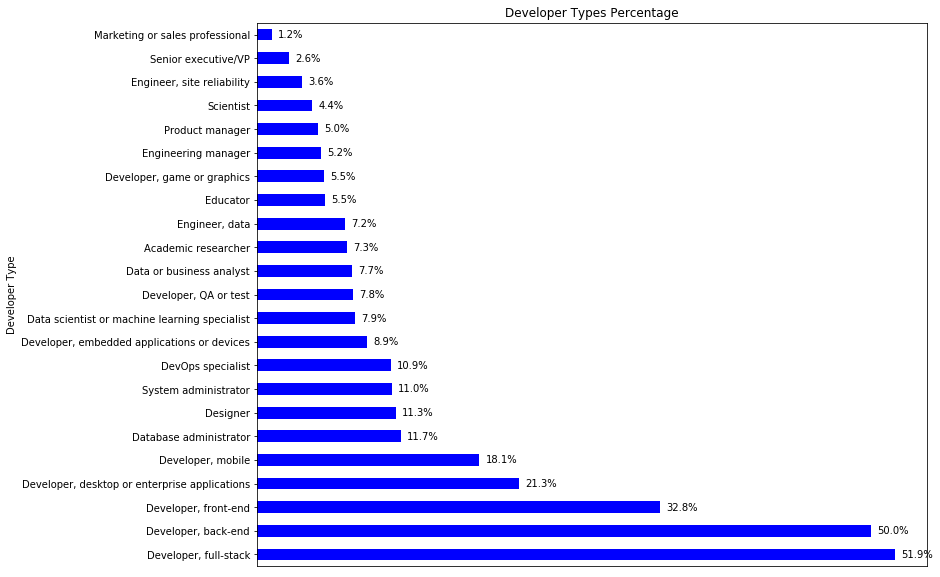

In [36]:
 # Plot bar chart
plt.figure(figsize = [12, 10])
ax = dev_type_pct.plot(kind="barh", color="blue")
plt.title('Developer Types Percentage')
plt.xlabel('Percentage (%)')
plt.ylabel('Developer Type')
ax.axes.get_xaxis().set_visible(False)

for p in ax.patches:
    percentage ='{:,.01f}%'.format(p.get_width())
    width, height =p.get_width()+.5, p.get_height()+ 0.01
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y), verticalalignment='center')


#ax.annotate('{:.0%}'.format(height), (p.get_x()+.5*width, p.get_y() + height + 0.01), ha = 'center')

7.94% of the respondents are Data Scientists or Machine Learning specialists

In [37]:
# Rename column
df = df.rename(columns={'Data scientist or machine learning specialist':'Data_scientist_or_ML_specialist'})

In [38]:
#df2 = df.copy()

In [39]:
# Drop rows with Nan values in Dev Type
df = df.dropna(subset=['Country'], how='any')

# Confirm Nan values have been removed
df['Country'].isnull().sum()

0

In [40]:
(df.groupby('Country').sum().Data_scientist_or_ML_specialist / len(df)).sort_values(ascending=False)

Country
United States                            0.020741
India                                    0.007758
Germany                                  0.005422
United Kingdom                           0.004365
Canada                                   0.002607
France                                   0.002066
Netherlands                              0.001955
Brazil                                   0.001807
Russian Federation                       0.001660
Spain                                    0.001611
Australia                                0.001561
Poland                                   0.001377
Italy                                    0.001303
Switzerland                              0.001266
Turkey                                   0.000959
Sweden                                   0.000947
Israel                                   0.000934
Iran                                     0.000922
Pakistan                                 0.000910
Denmark                                  0

In [41]:
# Now lets see how Data Scientists fare by country
ds_country = (df.groupby('Country').sum().Data_scientist_or_ML_specialist / df.Data_scientist_or_ML_specialist.sum()).sort_values(ascending=False)
ds_country_perc = 100 * ds_country
ds_country_perc
 #round(100 * survey[role_cols].sum() / len(survey), 1).sort_values(ascending=False)

Country
United States                            26.114551
India                                     9.767802
Germany                                   6.826625
United Kingdom                            5.495356
Canada                                    3.281734
France                                    2.600619
Netherlands                               2.461300
Brazil                                    2.275542
Russian Federation                        2.089783
Spain                                     2.027864
Australia                                 1.965944
Poland                                    1.733746
Italy                                     1.640867
Switzerland                               1.594427
Turkey                                    1.207430
Sweden                                    1.191950
Israel                                    1.176471
Iran                                      1.160991
Pakistan                                  1.145511
Denmark                

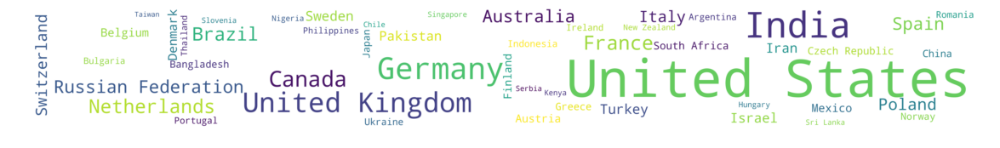

In [42]:
# plot a word cloud for top 50 countries
ds_country_dict = ds_country[:50].to_dict()
wc = WordCloud(background_color="white", width=8000,
               height=1000)
wc.generate_from_frequencies(ds_country_dict)
plt.figure(figsize=[20, 10])
plt.imshow(wc, interpolation="bilinear")
plt.axis('off');

# wc = WordCloud(background_color="white", max_words=2000, mask=dogs,
#                stopwords=stopwords, max_font_size=40, random_state=42)

In [43]:
# Now lets see how Data Scientists fare by continent
ds_continent = (df.groupby('Continent').sum().Data_scientist_or_ML_specialist / df.Data_scientist_or_ML_specialist.sum()).sort_values(ascending=False)
ds_continent_perc = 100 * ds_continent
ds_continent_perc
 #round(100 * survey[role_cols].sum() / len(survey), 1).sort_values(ascending=False)

Continent
Europe           38.699690
North America    30.758514
Asia             21.346749
South America     3.792570
Africa            3.018576
Oceania           2.383901
Name: Data_scientist_or_ML_specialist, dtype: float64

In [44]:
df.Continent.value_counts()

Europe           32848
North America    23600
Asia             16798
South America     3341
Africa            2508
Oceania           2240
Name: Continent, dtype: int64

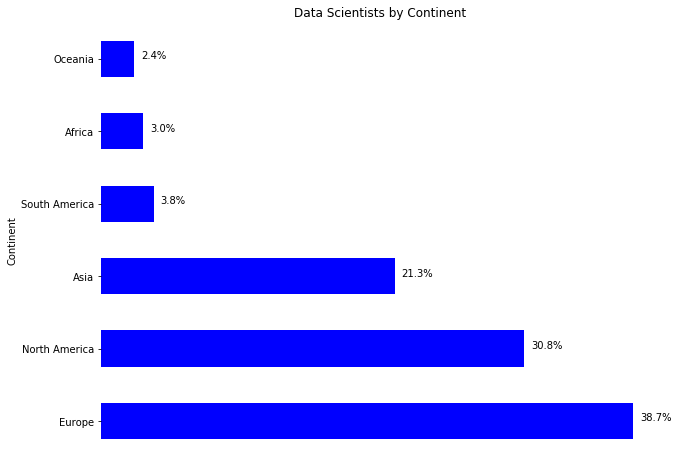

In [45]:
 # Plot bar chart
plt.figure(figsize = [10, 8])
ax = ds_continent_perc.plot(kind="barh", color="blue")
plt.title('Data Scientists by Continent')
plt.xlabel('Percentage (%)')
plt.ylabel('Continent');
ax.axes.get_xaxis().set_visible(False)

for p in ax.patches:
    percentage ='{:,.01f}%'.format(p.get_width())
    width, height =p.get_width()+.5, p.get_height()+ 0.01
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y))
for spine in ax.spines:
    ax.spines[spine].set_visible(False)

### OBSERVATION

- 7.94% of the respondents are Data Scientists or Machine Learning specialists
- Only 3% of repondents that are Data scientists or Machine Learning Specialists are resident in Africa.
- 69.5% of Data Scientists are in Europe and North America

### Q2. What is the education level and other qualifications of Data Scientists

In [46]:
# Call function to Display question text for survey questions of interest
question_list = ['DevType', 'EdLevel', 'UndergradMajor', 'EduOther']

for question in question_list:
    print_question_text(question)

DevType: Which of the following describe you? Please select all that apply.

EdLevel: Which of the following best describes the highest level of formal education that you’ve completed?

UndergradMajor: What was your main or most important field of study?

EduOther: Which of the following types of non-degree education have you used or participated in? Please select all that apply.



In [47]:
# Create a dataframe for Data scientist or Machine Learning specialists only
ds_ml = df.query('Data_scientist_or_ML_specialist == 1')
ds_ml.head()

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional
5,6,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,40000.0,Monthly,366420.0,15.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,NaN,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,28.0,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,10,I am a developer by profession,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,India,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)",NaN,NaN,"10,000 or more employees",Data or business analyst;Data scientist or mac...,12,20,10,Slightly dissatisfied,Slightly dissatisfied,Somewhat confident,Yes,Yes,"I’m not actively looking, but I am open to new...",3-4 years ago,NaN,No,"Languages, frameworks, and other technologies ...",NaN,INR,Indian rupee,950000.0,Yearly,13293.0,70.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,Far above average,"Yes, because I see value in code review",4.0,"Yes, it's par

In [48]:
#Get the shape of the data frame
ds_ml.shape

(6460, 109)

In [49]:
# Get the value counts of the Education level column and Other Education column
edu_level_val = ds_ml.EdLevel.value_counts()
edu_level_val

Master’s degree (MA, MS, M.Eng., MBA, etc.)                                           2301
Bachelor’s degree (BA, BS, B.Eng., etc.)                                              2261
Other doctoral degree (Ph.D, Ed.D., etc.)                                              780
Some college/university study without earning a degree                                 421
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     336
Associate degree                                                                       102
Professional degree (JD, MD, etc.)                                                      74
Primary/elementary school                                                               62
I never completed any formal education                                                  34
Name: EdLevel, dtype: int64

In [50]:
# Get the percentage of different education levels
edu_level_perc = 100 * (edu_level_val/ds_ml.shape[0])
edu_level_perc

Master’s degree (MA, MS, M.Eng., MBA, etc.)                                           35.619195
Bachelor’s degree (BA, BS, B.Eng., etc.)                                              35.000000
Other doctoral degree (Ph.D, Ed.D., etc.)                                             12.074303
Some college/university study without earning a degree                                 6.517028
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     5.201238
Associate degree                                                                       1.578947
Professional degree (JD, MD, etc.)                                                     1.145511
Primary/elementary school                                                              0.959752
I never completed any formal education                                                 0.526316
Name: EdLevel, dtype: float64

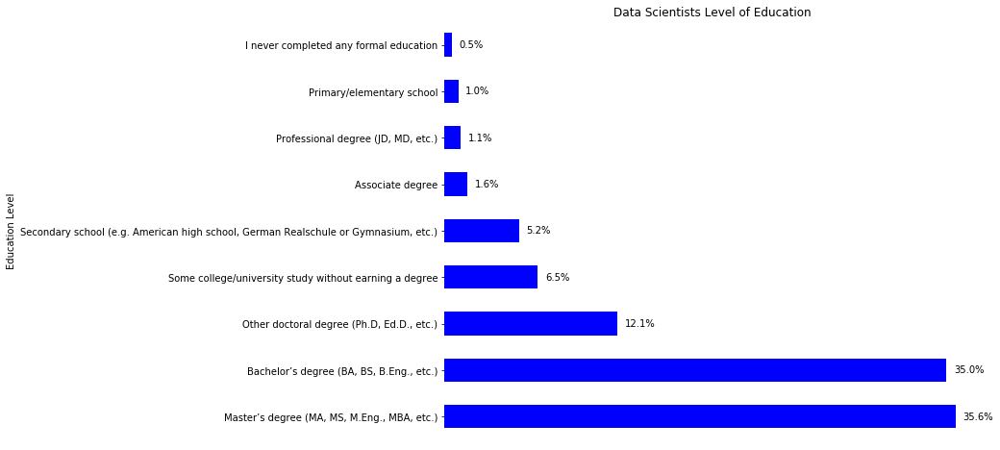

In [51]:
# Plot bar chart
plt.figure(figsize = [10, 8])
ax = edu_level_perc.plot(kind="barh", color="blue")
plt.title('Data Scientists Level of Education')
plt.xlabel('Percentage (%)')
plt.ylabel('Education Level');
ax.axes.get_xaxis().set_visible(False)

for p in ax.patches:
    percentage ='{:,.01f}%'.format(p.get_width())
    width, height =p.get_width()+.5, p.get_height()+ 0.01
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y), verticalalignment='center')
for spine in ax.spines:
    ax.spines[spine].set_visible(False)

In [52]:
# Under grad majors count
major_val = ds_ml.UndergradMajor.value_counts()
major_val

Computer science, computer engineering, or software engineering          3066
Mathematics or statistics                                                 749
A natural science (ex. biology, chemistry, physics)                       671
Another engineering discipline (ex. civil, electrical, mechanical)        558
Information systems, information technology, or system administration     233
A social science (ex. anthropology, psychology, political science)        169
A business discipline (ex. accounting, finance, marketing)                151
A humanities discipline (ex. literature, history, philosophy)              82
Web development or web design                                              57
Fine arts or performing arts (ex. graphic design, music, studio art)       36
A health science (ex. nursing, pharmacy, radiology)                        36
I never declared a major                                                   22
Name: UndergradMajor, dtype: int64

In [53]:
# Percentage of majors
major_val_perc = 100 * (major_val/ds_ml.shape[0])
major_val_perc

Computer science, computer engineering, or software engineering          47.461300
Mathematics or statistics                                                11.594427
A natural science (ex. biology, chemistry, physics)                      10.386997
Another engineering discipline (ex. civil, electrical, mechanical)        8.637771
Information systems, information technology, or system administration     3.606811
A social science (ex. anthropology, psychology, political science)        2.616099
A business discipline (ex. accounting, finance, marketing)                2.337461
A humanities discipline (ex. literature, history, philosophy)             1.269350
Web development or web design                                             0.882353
Fine arts or performing arts (ex. graphic design, music, studio art)      0.557276
A health science (ex. nursing, pharmacy, radiology)                       0.557276
I never declared a major                                                  0.340557
Name

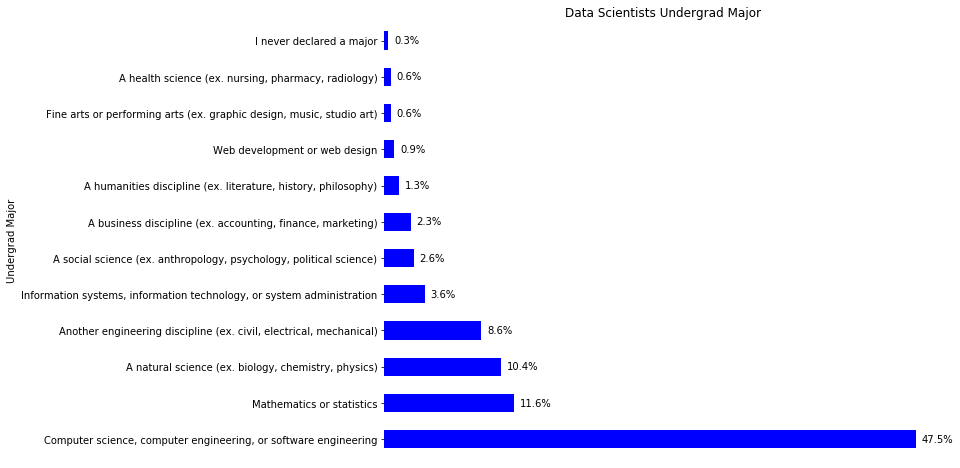

In [54]:
# Plot bar chart
plt.figure(figsize = [10, 8])
ax = major_val_perc.plot(kind="barh", color="blue")
plt.title('Data Scientists Undergrad Major')
plt.xlabel('Percentage (%)')
plt.ylabel('Undergrad Major');
ax.axes.get_xaxis().set_visible(False)

for p in ax.patches:
    percentage ='{:,.01f}%'.format(p.get_width())
    width, height =p.get_width()+.5, p.get_height()+ 0.01
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y), verticalalignment='center')
for spine in ax.spines:
    ax.spines[spine].set_visible(False)

In [55]:
# Value counts of other forms of education
other_edu_val = ds_ml.EduOther.value_counts()
other_edu_val

Taken an online course in programming or software development (e.g. a MOOC);Taught yourself a new language, framework, or tool without taking a formal course                                                                                                                                                                                                                                                                                                                                                                                                               468
Taught yourself a new language, framework, or tool without taking a formal course                                                                                                                                                                                                                                                                                                                                                                       

The other education column is messy and it will be a mess to plot. So it needs to be cleaned to get quality information

In [56]:
# Function that counts values in a column
def total_count(df, col1, col2, look_for):
    '''
    INPUT:
    df - the pandas dataframe you want to search
    col1 - the column name you want to look through
    col2 - the column you want to count values from
    look_for - a list of strings you want to search for in each row of df[col]

    OUTPUT:
    new_df - a dataframe of each look_for with the count of how often it shows up
    '''
    new_df = defaultdict(int)
    #loop through list of other education
    for val in look_for:
        #loop through rows
        for idx in range(df.shape[0]):
            #if the ed type is in the row add 1
            if val in df[col1][idx]:
                new_df[val] += int(df[col2][idx])
    new_df = pd.DataFrame(pd.Series(new_df)).reset_index()
    new_df.columns = [col1, col2]
    new_df.sort_values('count', ascending=False, inplace=True)
    return new_df

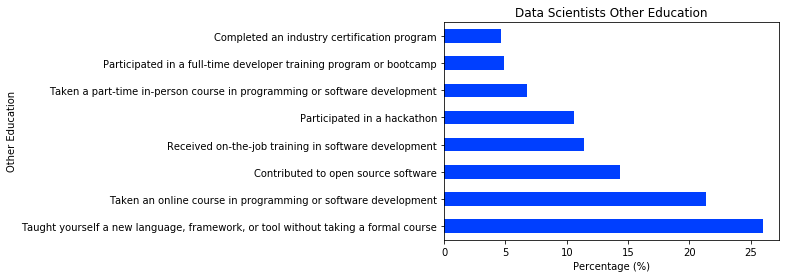

In [57]:
# Write a function that goes through a column and extracts possible values listed, counts them and plots the df
possible_vals = ["Taken an online course in programming or software development", "Taught yourself a new language, framework, or tool without taking a formal course", 
                 "Received on-the-job training in software development", "Participated in a full-time developer training program or bootcamp", 
                 "Taken a part-time in-person course in programming or software development",
                 "Contributed to open source software", "Completed an industry certification program", "Participated in a hackathon", "Other"]

def clean_and_plot(ds_ml, title='Other Education', plot=True):
    '''
    INPUT 
        df - a dataframe holding other education column
        title - string the title of your plot
        axis - axis object
        plot - bool providing whether or not you want a plot back
        
    OUTPUT
        study_df - a dataframe with the count of how many individuals
        Displays a plot of pretty things related to the other education column.
    '''
    study = ds_ml['EduOther'].value_counts().reset_index()
    study.rename(columns={'index': 'method', 'EduOther': 'count'}, inplace=True)
    study_df = total_count(study, 'method', 'count', possible_vals)

    study_df.set_index('method', inplace=True)
    if plot:
        plt.figure(figsize = [10, 8])
        (100 * study_df/study_df.sum()).plot(kind='barh', legend=None)
        plt.title('Data Scientists Other Education')
        plt.xlabel('Percentage (%)')
        plt.ylabel('Other Education');
        plt.show()
    props_study_df = study_df/study_df.sum()
    return props_study_df
    
props_df = clean_and_plot(ds_ml);

 

Lets see if level of education determines type of other education determines the type of other education data scientists have

In [58]:
# Write function that outputs 1 if in list of top 3 education and 0 in other
def education(top_ed_str):
    '''
    INPUT
        formal_ed_str - a string of one of the values from the Formal Education column
    
    OUTPUT
        return 1 if the string is  in ("Master's degree", "Doctor", "Professional degree")
        return 0 otherwise
    
    '''
    if top_ed_str in ("Other doctoral degree (Ph.D, Ed.D., etc.)", "Master’s degree (MA, MS, M.Eng., MBA, etc.)", "Bachelor’s degree (BA, BS, B.Eng., etc.)"):
        
        return 1
    else:
        return 0

# Use function on #Education Level Column
ds_ml["EdLevel"].apply(education)

5        1
9        1
11       0
32       1
61       0
65       1
96       1
98       0
109      1
128      1
132      0
143      1
144      0
172      1
182      1
187      1
190      1
195      1
197      1
200      0
226      1
246      1
280      0
288      1
297      1
308      0
332      1
335      1
357      1
368      1
372      1
379      1
383      1
409      1
411      0
493      1
515      0
521      0
522      1
537      0
540      1
548      1
553      1
560      1
561      1
568      1
570      0
597      0
638      0
654      1
656      1
675      1
678      1
716      0
725      1
744      1
752      0
768      1
769      0
773      1
790      1
792      1
800      1
832      1
835      1
843      1
851      1
868      1
871      1
892      1
896      1
897      1
901      1
903      1
918      1
941      1
960      1
986      1
988      0
989      1
998      1
1014     1
1054     1
1095     1
1122     1
1123     1
1139     1
1142     1
1144     1
1153     1
1181     1

In [59]:
# Check your code here
ds_ml['Education'] = ds_ml["EdLevel"].apply(education)
higher_ed_perc = ds_ml['Education'].mean()
higher_ed_perc

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


0.82693498452012382

Those with higher education form 82.7 percent of those who identify as data scientists as we have seen before

In [60]:
# Subset df to only those with Education of 1
ed_1 = ds_ml[ds_ml['Education'] == 1]

# Subset df to only those with Education of 0
ed_0 = ds_ml[ds_ml['Education'] == 0]


# Print to confirm
print(ed_1['Education'][:5])
print(ed_0['Education'][:5]) 

5     1
9     1
32    1
65    1
96    1
Name: Education, dtype: int64
11     0
61     0
98     0
132    0
144    0
Name: Education, dtype: int64


In [61]:
ed_1_perc = clean_and_plot(ed_1, 'top_ed', plot=False)
ed_0_perc = clean_and_plot(ed_0, 'low_ed', plot=False)

comp_df = pd.merge(ed_1_perc, ed_0_perc, left_index=True, right_index=True)
comp_df.columns = ['ed_1_perc', 'ed_0_perc']
comp_df['Diff_Ed_Vals'] = comp_df['ed_1_perc'] - comp_df['ed_0_perc']
comp_df.style.bar(subset=['Diff_Ed_Vals'], align='mid', color=['#d65f5f', '#5fba7d'])

,ed_1_perc,ed_0_perc,Diff_Ed_Vals
method,,,
"Taught yourself a new language, framework, or tool without taking a formal course",0.262846,0.246679,0.0161675
Taken an online course in programming or software development,0.215714,0.201875,0.013839
Contributed to open source software,0.143005,0.143787,-0.000782502
Received on-the-job training in software development,0.117082,0.102631,0.0144515
Participated in a hackathon,0.106909,0.101589,0.00531988
Taken a part-time in-person course in programming or software development,0.0640303,0.084397,-0.0203666
Participated in a full-time developer training program or bootcamp,0.0465571,0.0593905,-0.0128334
Completed an industry certification program,0.0438556,0.059651,-0.0157953


### OBSERVATION

- 35.6% of Data Scientists have a Masters degree, 35% have a Bachelors degree and 12% have a doctoral degree. They make up the overwhelming majority of Data

- 47.5% of Data Scientists have a Computer science, computer engineering, or software engineering major, 11.6% majored in Maths or statistics. Combined they for more than half of Data Scientists. Natural Sciences and other Engineering have 10.4% and 8.6% respectively.
- Those with the top 3 level of education had higher percentages in teaching themselves new language, taking online courses, received on the job training and participated in hackathon.
- While those with other levels of education had higher percentages in contributing to open source software, taking part time courses, participated in bootcamps and completed industry certification programs.
- Regardless of level of education teaching yourself and online courses are the top forms of other education for data scientists.

### Q3. How many data scientists are only starting out professionally in the field.

In [62]:
# Use function to get questions from schema in relevant columns
question_list = ['YearsCodePro', 'YearsCode']

for question in question_list:
    print_question_text(question)

YearsCodePro: How many years have you coded professionally (as a part of your work)?

YearsCode: Including any education, how many years have you been coding?



In [63]:
# See first few rows of df
ds_ml.head(2)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
5,6,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,40000.0,Monthly,366420.0,15.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,NaN,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,28.0,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
9,10,I am a developer by profession,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,India,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)",NaN,NaN,"10,000 or more employees",Data or business analyst;Data scientist or mac...,12,20,10,Slightly dissatisfied,Slightly dissatisfied,Somewhat confident,Yes,Yes,"I’m not actively looking, but I am open to new...",3-4 years ago,NaN,No,"Languages, frameworks, and other technologies ...",NaN,INR,Indian rupee,950000.0,Yearly,13293.0,70.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,Far above average,"Yes, because I see value in code review",4.0,"Y

In [64]:
# Those starting out professionally are those with Less than one year or 1 year of professional experience. We use query 
# to provide a df for only those
ds_ml_pro = ds_ml.query('YearsCodePro == "1" or YearsCodePro == "Less than 1 year"')
ds_ml_pro.head()

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
61,62,I am a developer by profession,Yes,Less than once a month but more than once per ...,"OSS is, on average, of LOWER quality than prop...",Employed full-time,Netherlands,1,Associate degree,"Computer science, computer engineering, or sof...",Taken an online course in programming or softw...,"10,000 or more employees",Data or business analyst;Data scientist or mac...,1,11,1,Very satisfied,Slightly dissatisfied,Not at all confident,No,Yes,"I’m not actively looking, but I am open to new...",1-2 years ago,"Write any code;Write code by hand (e.g., on a ...",No,Remote work options;Opportunities for professi...,"Something else changed (education, award, medi...",EUR,European Euro,76800.0,Yearly,87994.0,45.0,There is a schedule and/or spec (made by me or...,Inadequate access to necessary tools;Lack of s...,Less than once per month / Never,Home,Far above average,"Yes, because I see value in code review",10.0,"Yes, it's not part of our process but the deve...",NaN,I have some influence,Bash/Shell/PowerShell;C++;Go;HTML/CSS;Java;Jav...,Bash/Shell/PowerShell;C;C++;C#;HTML/CSS;Java;J...,MariaDB;Microsoft SQL Server;MySQL;Oracle;Post...,MariaDB;MySQL;Oracle;PostgreSQL;SQLite,Android;Linux;MacOS;Microsoft Azure;Raspberry ...,Android;Docker;Google Cloud Platform;Heroku;iO...,Django;jQuery;React.js,ASP.NET;Django;Laravel;React.js,.NET;Node.js;React Native,.NET;Node.js;React Native,Atom;NetBeans;Notepad++;PHPStorm;PyCharm;Subli...,Windows,Testing,NaN,A passing fad,Yes,Yes,Yes,Reddit,In real life (in person),Username,2013,A few times per week,Find answers to specific questions;Contribute ...,1-2 times per week,The other resource was slightly faster,31-60 minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, I've heard of them, but I am not part of a...","Yes, somewhat",A lot less welcome now than last year,Tech articles written by other developers;Indu...,19.0,Man,No,Straight / Heterosexual,White or of European descent,No,Appropriate in length,Easy,Europe,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0
515,517,"I am not primarily a developer, but I write co...",No,Less than once per year,The quality of OSS and closed source software ...,"Not employed, but looking for work",United States,"Yes, part-time",Associate degree,"Another engineering discipline (ex. civil, ele...",Participated in a full-time developer training..

In [65]:
# Get the number of those only starting out as Data Scientists
ds_ml_pro.YearsCodePro.value_counts()

1                   372
Less than 1 year    299
Name: YearsCodePro, dtype: int64

In [66]:
# Percentages of those just starting out
ds_ml_pro_perc = 100 * ds_ml_pro.shape[0] / ds_ml.shape[0]
ds_ml_pro_perc

10.386996904024768

10.4% of Data Scientists are only starting out

In [67]:
ds_ml_pro = ds_ml.YearsCodePro.value_counts()
ds_ml_pro_perc = 100 * ds_ml_pro / ds_ml.shape[0]
ds_ml_pro_perc

2                     10.634675
3                     10.386997
5                      7.863777
4                      7.585139
1                      5.758514
10                     5.232198
6                      4.783282
Less than 1 year       4.628483
8                      3.947368
7                      3.854489
9                      2.523220
20                     2.492260
12                     2.105263
15                     1.996904
11                     1.718266
13                     1.470588
14                     1.160991
18                     1.160991
25                     1.006192
16                     0.944272
30                     0.712074
22                     0.650155
23                     0.603715
21                     0.557276
19                     0.557276
17                     0.541796
24                     0.371517
28                     0.309598
35                     0.232198
26                     0.232198
32                     0.232198
40      

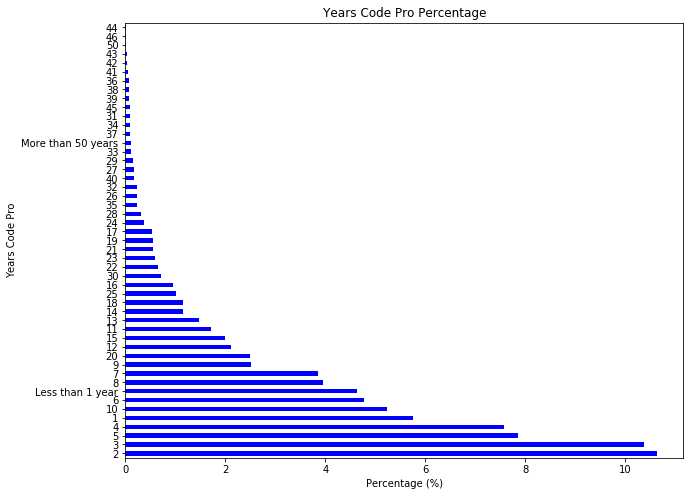

In [68]:
# Plot bar chart
plt.figure(figsize = [10, 8])
ds_ml_pro_perc.plot(kind="barh", color="blue")
plt.title('Years Code Pro Percentage')
plt.xlabel('Percentage (%)')
plt.ylabel('Years Code Pro');

### OBSERVATION

10.4% of Data Scientists are only starting out

### Q4. What are the most common programming languages?

In [69]:
df.head(1)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional
1,2,I am a student who is learning to code,No,Less than once per year,The quality of OSS and closed source software ...,"Not employed, but looking for work",Bosnia and Herzegovina,"Yes, full-time","Secondary school (e.g. American high school, G...",NaN,Taken an online course in programming or softw...,NaN,"Developer, desktop or enterprise applications;...",NaN,17,NaN,NaN,NaN,NaN,NaN,NaN,I am actively looking for a job,I've never had a job,NaN,NaN,Financial performance or funding status of the...,"Something else changed (education, award, medi...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,C++;HTML/CSS;Python,C++;HTML/CSS;JavaScript;SQL,NaN,MySQL,Windows,Windows,Django,Django,NaN,NaN,Atom;PyCharm,Windows,I do not use containers,NaN,Useful across many domains and could change ma...,Yes,Yes,Yes,Instagram,Online,Username,2017,Daily or almost daily,Find answers to specific questions;Learn how t...,3-5 times per week,Stack Overflow was much faster,11-30 minutes,Yes,A few times per month or weekly,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","Yes, somewhat",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,19.0,Man,No,Straight / Heterosexual,NaN,No,Appropriate in length,Neither easy nor difficult,Europe,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [70]:
# Get schema questions for columns
questions = ['LanguageWorkedWith', 'LanguageDesireNextYear', 'DatabaseWorkedWith']
for question in questions:
    print_question_text(question)


LanguageWorkedWith: Which of the following programming, scripting, and markup languages have you done extensive development work in over the past year, and which do you want to work in over the next year?  (If you both worked with the language and want to continue to do so, please check both boxes in that row.)

LanguageDesireNextYear: Which of the following programming, scripting, and markup languages have you done extensive development work in over the past year, and which do you want to work in over the next year?  (If you both worked with the language and want to continue to do so, please check both boxes in that row.)

DatabaseWorkedWith: Which of the following database environments have you done extensive development work in over the past year, and which do you want to work in over the next year?   (If you both worked with the database and want to continue to do so, please check both boxes in that row.)



We will be using the language worked with to answer our question

In [71]:
# Get value counts 
ds_ml.LanguageWorkedWith.value_counts()

Python                                                                                                                                                                                              173
Python;R;SQL                                                                                                                                                                                        109
Python;SQL                                                                                                                                                                                           84
Python;R                                                                                                                                                                                             81
Bash/Shell/PowerShell;Python;R;SQL                                                                                                                                                                   72


In [72]:
ds_ml.DatabaseWorkedWith.value_counts()

MySQL                                                                                                                                      265
Microsoft SQL Server                                                                                                                       247
PostgreSQL                                                                                                                                 234
SQLite                                                                                                                                     143
PostgreSQL;SQLite                                                                                                                          124
MySQL;SQLite                                                                                                                               119
Microsoft SQL Server;MySQL                                                                                                                 109

In [73]:
# Make a copy of df
ds_lang = ds_ml.copy()

In [74]:
# Drop rows with Nan values in Language worked with column
ds_lang = ds_lang.dropna(subset=['LanguageWorkedWith'], how='any')

# Confirm Nan values have been removed
ds_lang['LanguageWorkedWith'].isnull().sum()

0

In [75]:
#Call function to split column into multiple, value-specific columns
ds_lang, lang_cols = split_col_vals(ds_lang, 'LanguageWorkedWith')

In [76]:
ds_lang.head(1)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education,Java,R,SQL,C#,Go,JavaScript,Python,Bash/Shell/PowerShell,HTML/CSS,C++,Kotlin,PHP,Ruby,TypeScript,VBA,Clojure,C,Assembly,Scala,Objective-C,Rust,Swift,F#,Other(s):,Erlang,Dart,WebAssembly,Elixir
5,6,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,40000.0,Monthly,366420.0,15.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,NaN,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,28.0,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
# Drop Language worked with column
ds_lang.drop(columns=['LanguageWorkedWith'], inplace=True)
ds_lang.reset_index(drop=True, inplace=True)

In [78]:
# Get mean of each languages used by Data Scientists
lang_type_pct = ds_lang[lang_cols].mean().sort_values(ascending=False) *100
lang_type_pct 

Python                   80.165806
SQL                      59.048960
JavaScript               51.916158
HTML/CSS                 50.961990
Bash/Shell/PowerShell    44.955420
Java                     38.370092
C++                      32.316596
R                        30.893164
C                        26.184890
C#                       22.884405
PHP                      18.739246
TypeScript               13.389645
Other(s):                10.667918
Scala                     9.557328
Assembly                  8.837791
Go                        8.806507
VBA                       7.664633
Ruby                      6.663538
Swift                     5.114969
Kotlin                    4.755201
Objective-C               3.973096
Rust                      3.707180
Clojure                   2.189895
WebAssembly               1.892695
Dart                      1.861411
Elixir                    1.689348
F#                        1.564211
Erlang                    1.486000
dtype: float64

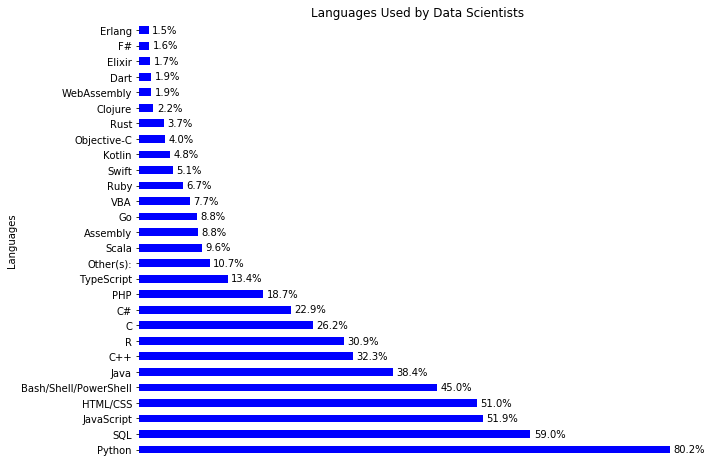

In [79]:
# Plot bar chart
plt.figure(figsize = [10, 8])
ax = lang_type_pct.plot(kind="barh", color="blue")
plt.title('Languages Used by Data Scientists')
plt.xlabel('Percentage (%)')
plt.ylabel('Languages');
ax.axes.get_xaxis().set_visible(False)

for p in ax.patches:
    percentage ='{:,.01f}%'.format(p.get_width())
    width, height =p.get_width()+.5, p.get_height()+ 0.01
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y), verticalalignment='center')
for spine in ax.spines:
    ax.spines[spine].set_visible(False)

### OBSERVATION
In 2019, 80.2% of data scientists have used Python, 59% have used SQL, 52% have used JavaScript and 51% have used HTML/CSS. The least used are Exilir, F# and Erlang 

which of these programming languages do those just starting out professionally use?

In [80]:
ds_lang_pro = ds_lang.query('YearsCodePro == "1" or YearsCodePro == "Less than 1 year"')
ds_lang_pro.head(1)


,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education,Java,R,SQL,C#,Go,JavaScript,Python,Bash/Shell/PowerShell,HTML/CSS,C++,Kotlin,PHP,Ruby,TypeScript,VBA,Clojure,C,Assembly,Scala,Objective-C,Rust,Swift,F#,Other(s):,Erlang,Dart,WebAssembly,Elixir
4,62,I am a developer by profession,Yes,Less than once a month but more than once per ...,"OSS is, on average, of LOWER quality than prop...",Employed full-time,Netherlands,1,Associate degree,"Computer science, computer engineering, or sof...",Taken an online course in programming or softw...,"10,000 or more employees",Data or business analyst;Data scientist or mac...,1,11,1,Very satisfied,Slightly dissatisfied,Not at all confident,No,Yes,"I’m not actively looking, but I am open to new...",1-2 years ago,"Write any code;Write code by hand (e.g., on a ...",No,Remote work options;Opportunities for professi...,"Something else changed (education, award, medi...",EUR,European Euro,76800.0,Yearly,87994.0,45.0,There is a schedule and/or spec (made by me or...,Inadequate access to necessary tools;Lack of s...,Less than once per month / Never,Home,Far above average,"Yes, because I see value in code review",10.0,"Yes, it's not part of our process but the deve...",NaN,I have some influence,Bash/Shell/PowerShell;C;C++;C#;HTML/CSS;Java;J...,MariaDB;Microsoft SQL Server;MySQL;Oracle;Post...,MariaDB;MySQL;Oracle;PostgreSQL;SQLite,Android;Linux;MacOS;Microsoft Azure;Raspberry ...,Android;Docker;Google Cloud Platform;Heroku;iO...,Django;jQuery;React.js,ASP.NET;Django;Laravel;React.js,.NET;Node.js;React Native,.NET;Node.js;React Native,Atom;NetBeans;Notepad++;PHPStorm;PyCharm;Subli...,Windows,Testing,NaN,A passing fad,Yes,Yes,Yes,Reddit,In real life (in person),Username,2013,A few times per week,Find answers to specific questions;Contribute ...,1-2 times per week,The other resource was slightly faster,31-60 minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, I've heard of them, but I am not part of a...","Yes, somewhat",A lot less welcome now than last year,Tech articles written by other developers;Indu...,19.0,Man,No,Straight / Heterosexual,White or of European descent,No,Appropriate in length,Easy,Europe,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [81]:
ds_lang_pro.YearsCodePro.value_counts()

1                   369
Less than 1 year    294
Name: YearsCodePro, dtype: int64

In [82]:
# Get mean of each language used by Data Scientists starting out professionally
lang_type_pct_pro = ds_lang_pro[lang_cols].mean().sort_values(ascending=False) *100
lang_type_pct_pro 

Python                   85.671192
SQL                      55.203620
HTML/CSS                 44.645551
JavaScript               41.327300
Bash/Shell/PowerShell    37.858220
Java                     36.953243
R                        31.523379
C++                      28.959276
C                        22.322775
C#                       18.552036
PHP                      15.686275
TypeScript                9.200603
Assembly                  8.295626
Other(s):                 7.088989
VBA                       5.279035
Ruby                      4.977376
Scala                     4.524887
Kotlin                    4.072398
Go                        4.072398
Swift                     3.016591
Dart                      2.262443
Objective-C               1.809955
Rust                      1.809955
Clojure                   1.659125
F#                        1.508296
WebAssembly               0.904977
Erlang                    0.754148
Elixir                    0.754148
dtype: float64

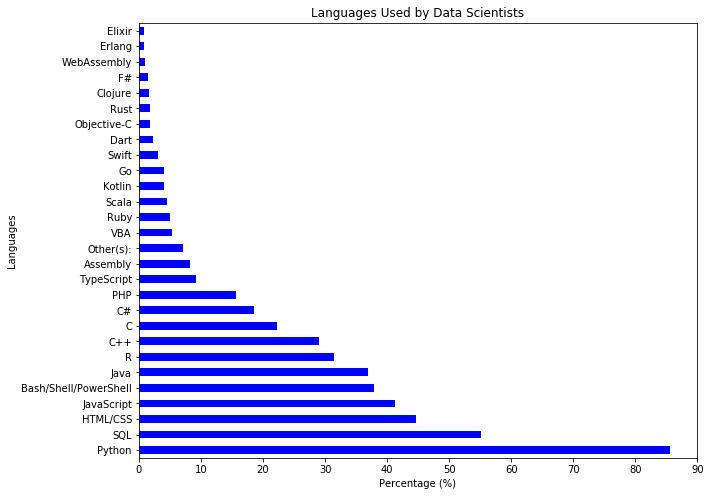

In [83]:
# Plot bar chart
plt.figure(figsize = [10, 8])
lang_type_pct_pro.plot(kind="barh", color="blue")
plt.title('Languages Used by Data Scientists')
plt.xlabel('Percentage (%)')
plt.ylabel('Languages');

In [84]:
# # Generate side-by-side comparison of lanagues used vs mean converted compensation for each language
# fig, ax = return_adjacent_barh(ds_lang_df, 'Lang_pct', 'Mean_ConvertedComp')
# fig.set_size_inches(14.5, 12)
# ax[0].set_xticks(list(range(0,91,10)))
# ax[0].set_xlabel('Percentage (%)', fontsize=fs+1)
# title_text = f'Languages used extensively within last year by {len(ds_lang):,} \n '\
#              f'\'{ds_role_title}\' respondents.'
# ax[0].set_title(title_text, fontsize=fs+1)

# title_text = f'Mean converted salary (outliers removed) of {len(ds_lang):,} \n \'{ds_role_title}\' ' \
#              f'respondents vs. programming language'
# ax[1].set_xticks(list(range(0,510,50)))
# ax[1].set_xlabel('Mean converted salary ($K USD)', fontsize=fs+1)
# ax[1].set_title(title_text, fontsize=fs+1) ;

### Q5. How much remote work do Data Scientists do?

In [85]:
# GET QUESTION FROM SCHEMA
print_question_text('WorkRemote')

WorkRemote: How often do you work remotely?



In [86]:
# Get value counts for remote work
ds_ml.WorkRemote.value_counts()

Less than once per month / Never                           1942
A few days each month                                      1465
All or almost all the time (I'm full-time remote)           653
Less than half the time, but at least one day each week     555
It's complicated                                            317
More than half, but not all, the time                       248
About half the time                                         166
Name: WorkRemote, dtype: int64

In [87]:
# Get null values
ds_ml['WorkRemote'].isnull().sum()

1114

In [88]:
# Get mean of how Data scientists work remotely
remote_pct = 100 * ds_ml.WorkRemote.value_counts()/ds_ml.shape[0]
remote_pct

Less than once per month / Never                           30.061920
A few days each month                                      22.678019
All or almost all the time (I'm full-time remote)          10.108359
Less than half the time, but at least one day each week     8.591331
It's complicated                                            4.907121
More than half, but not all, the time                       3.839009
About half the time                                         2.569659
Name: WorkRemote, dtype: float64

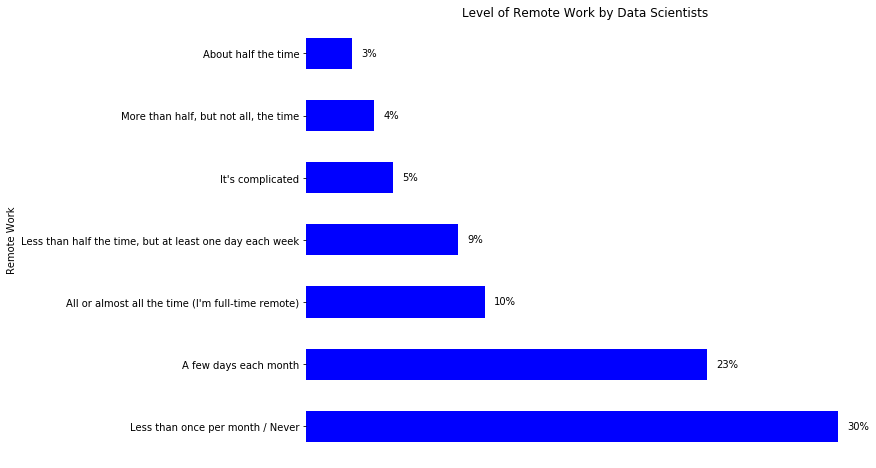

In [89]:
# Plot bar chart
plt.figure(figsize = [10, 8])
ax = remote_pct.plot(kind="barh", color="blue")
plt.title('Level of Remote Work by Data Scientists')
plt.xlabel('Percentage (%)')
plt.ylabel('Remote Work');

ax.axes.get_xaxis().set_visible(False)

for p in ax.patches:
    percentage ='{:,.0f}%'.format(p.get_width())
    width, height =p.get_width()+.5, p.get_height()+ 0.01
    x=p.get_x()+width+0.02
    y=p.get_y()+height/2
    ax.annotate(percentage,(x,y), verticalalignment='center')
for spine in ax.spines:
    ax.spines[spine].set_visible(False)

### OBSERVATION

- Only 10% of Data scientists reported doing full time remote work in 2019.
- Less than once per month / Never and A few days each month make up 52% of responses.

How is the compensation in reference to level of remote work?

In [90]:
# Get compensation by level of remote work
remote_comp = ds_ml.groupby('WorkRemote').mean().ConvertedComp.sort_values(ascending=False)
remote_comp

WorkRemote
All or almost all the time (I'm full-time remote)          162255.685535
Less than half the time, but at least one day each week    149128.756579
More than half, but not all, the time                      148323.610169
It's complicated                                           140854.913876
A few days each month                                      140829.358367
Less than once per month / Never                           137052.765888
About half the time                                        117504.284553
Name: ConvertedComp, dtype: float64

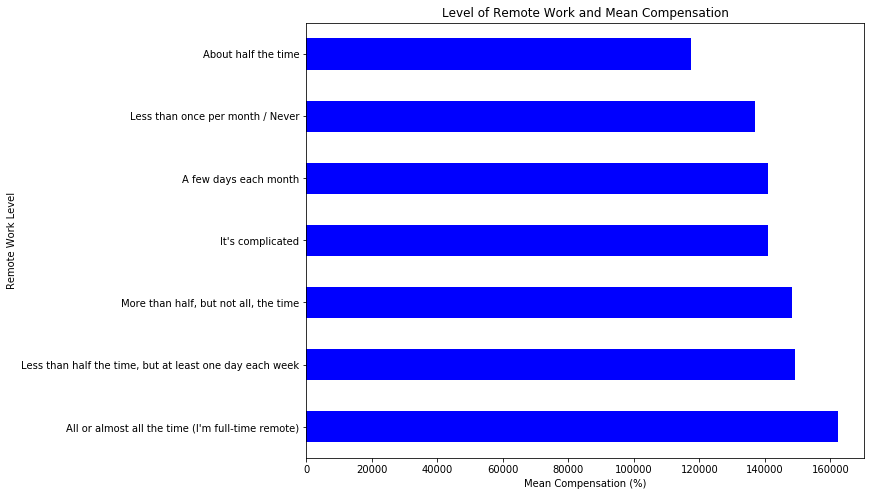

In [91]:
# Plot bar chart
plt.figure(figsize = [10, 8])
remote_comp.plot(kind="barh", color="blue")
plt.title('Level of Remote Work and Mean Compensation')
plt.xlabel('Mean Compensation (%)')
plt.ylabel('Remote Work Level');

Lets go further to get the Best countries for remote work compensation

In [92]:
# df = {}

# for year in year_span:
#     # we want to remove all people who earn nothing or less than 1000$ (likely unemployed or outliers)
#     # we also remove all values over 250k $
#     # so that we do not weigh down our statistics
#     drop_indexes = ds_ml.query('ConvertedComp <= 1000')
#     indexes_to_drop = sal_df[year][(sal_df[year]['Salary'] <= 1000) |
#                          (sal_df[year]['Salary'] > 250000)].index
#     df[year] = sal_df[year].drop(indexes_to_drop, errors='ignore')
#     # we want to keep a filtered copy of sal_df before we remove the columns we don't need
#     sal_df[year] = df[year]
#     df[year] = df[year].filter(columns_to_clean).groupby('Country').mean()
#     # some results seem unlikely (very high but countries are poor)
#     # we introduce a filter based on minimum count of 100 contributions
#     df[year]['Salary_count'] = sal_df[year].filter(columns_to_clean).groupby('Country').count()
#     df[year] = df[year][df[year]['Salary_count'] > 100]
#     df[year] = df[year].drop('Salary_count', axis=1)
#     # we now remove/replace the unnecessary indexes
#     df[year].drop(remove_list, errors='ignore', inplace=True)
#     df[year].rename(replace_dict, errors='ignore', inplace=True)
#     # we introduce and additional column containing the year of reference
#     df[year]['Year'] = [int(year) for i in range(len(df[year]))]

In [93]:
# we want to remove all people who earn nothing or less than 1000$ (likely unemployed or outliers)
# we also remove all values over 250k $
# so that we do not weigh down our statistics
comp_df = ds_ml.query('ConvertedComp >= 1000' or 'ConvertedComp <= 250000')
comp_df2 = comp_df[['Country', 'WorkRemote', 'ConvertedComp']]

In [94]:
comp_df.head()

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
5,6,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,40000.0,Monthly,366420.0,15.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,NaN,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,28.0,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
9,10,I am a developer by profession,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,India,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)",NaN,NaN,"10,000 or more employees",Data or business analyst;Data scientist or mac...,12,20,10,Slightly dissatisfied,Slightly dissatisfied,Somewhat confident,Yes,Yes,"I’m not actively looking, but I am open to new...",3-4 years ago,NaN,No,"Languages, frameworks, and other technologies ...",NaN,INR,Indian rupee,950000.0,Yearly,13293.0,70.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,Far above average,"Yes, because I see value in code review",4.0,"Y

In [95]:
# we introduce a filter based on minimum count of 80 contributions
comp_df5 = comp_df[comp_df.groupby('Country')['Country'].transform('count') >= 80]
comp_df5.head(2)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
5,6,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,40000.0,Monthly,366420.0,15.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,NaN,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,28.0,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
9,10,I am a developer by profession,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,India,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)",NaN,NaN,"10,000 or more employees",Data or business analyst;Data scientist or mac...,12,20,10,Slightly dissatisfied,Slightly dissatisfied,Somewhat confident,Yes,Yes,"I’m not actively looking, but I am open to new...",3-4 years ago,NaN,No,"Languages, frameworks, and other technologies ...",NaN,INR,Indian rupee,950000.0,Yearly,13293.0,70.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,Far above average,"Yes, because I see value in code review",4.0,"Y

In [96]:
work_remote_comp = comp_df5.groupby('WorkRemote').mean().ConvertedComp.sort_values(ascending=False)
work_remote_comp

WorkRemote
More than half, but not all, the time                      202481.598291
All or almost all the time (I'm full-time remote)          201003.027864
It's complicated                                           196214.304688
Less than half the time, but at least one day each week    182844.707317
A few days each month                                      178522.965035
Less than once per month / Never                           169901.373814
About half the time                                        164079.766234
Name: ConvertedComp, dtype: float64

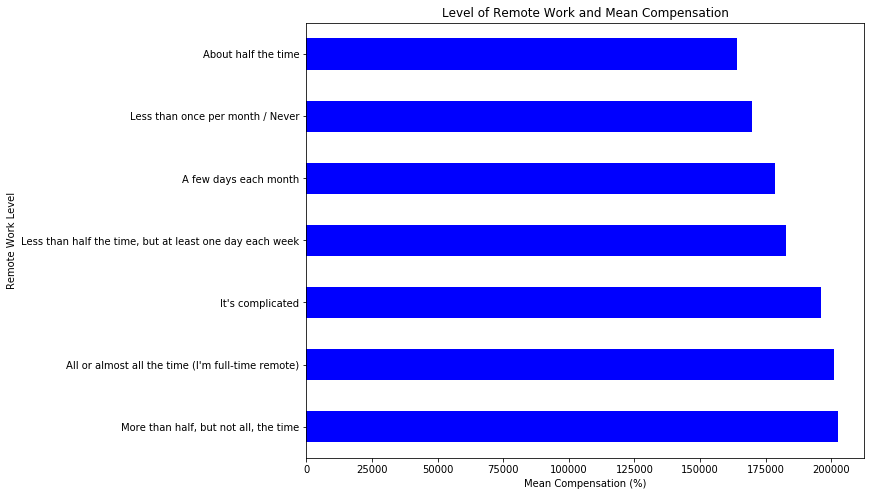

In [97]:
# Plot bar chart
plt.figure(figsize = [10, 8])
work_remote_comp.plot(kind="barh", color="blue")
plt.title('Level of Remote Work and Mean Compensation')
plt.xlabel('Mean Compensation (%)')
plt.ylabel('Remote Work Level');

### OBSERVATION

- Those doing remote work all or most of the time have the 2nd highest mean compensation in the top countries

### Q6. How does compensation vary by continent / WHERE TO FIND THE BEST JOBS?

In [98]:
# Make copy of ds_ml df
ds_ml_comp = ds_ml.copy()

In [99]:
# Get mean compensation for data scientists by continent
cont_comp = ds_ml_comp.groupby('Continent').mean().ConvertedComp.sort_values(ascending=False)
cont_comp

Continent
North America    256583.965374
Oceania          141687.082569
Europe            98527.848050
Africa            54716.723684
Asia              49254.756353
South America     27011.297143
Name: ConvertedComp, dtype: float64

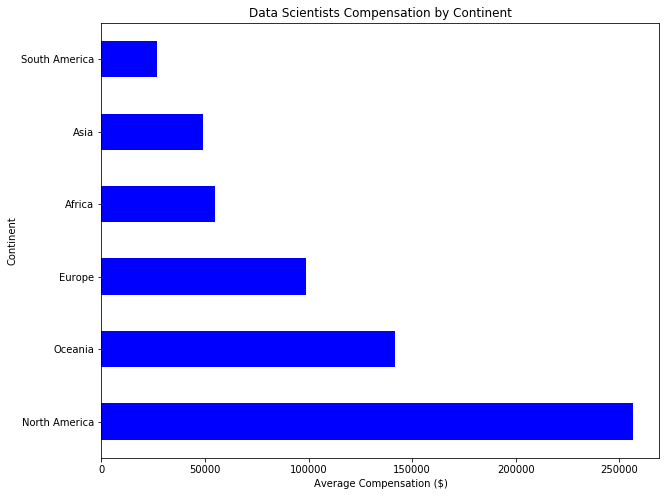

In [100]:
# Plot bar chart
plt.figure(figsize = [10, 8])
cont_comp.plot(kind="barh", color="blue")
plt.title('Data Scientists Compensation by Continent')
plt.xlabel('Average Compensation ($)')
plt.ylabel('Continent');

Lets dig deeper, drop outliers and see how this affects our results

In [101]:
# Drop rows with Nan values in df 
ds_ml_comp = ds_ml_comp.dropna(subset=['ConvertedComp'], how='any')

# Confirm nan values have been dropped
ds_ml_comp['ConvertedComp'].isnull().sum()

0

In [102]:
# Get value counts for continents
ds_ml_comp.Continent.value_counts()

Europe           1744
North America    1444
Asia              669
South America     175
Oceania           109
Africa             76
Name: Continent, dtype: int64

In [103]:
# Create dataframe of the country of residence and converted compensation of data scientist
cont_ds_comp = ds_ml_comp[['Continent', 'ConvertedComp']]
cont_ds_comp

,Continent,ConvertedComp
5,North America,366420.0
9,Asia,13293.0
32,South America,8400.0
61,Europe,87994.0
65,Europe,137490.0
96,North America,66750.0
109,North America,100000.0
128,North America,62000.0
172,Asia,2016.0
182,Europe,40101.0


In [104]:
# Create list of continents
cont_list = set(list(ds_ml_comp['Continent']))
cont_list

{'Africa', 'Asia', 'Europe', 'North America', 'Oceania', 'South America'}

In [105]:
# For each continent remove outliers based on Tukey method
cont_ds_ml_filtered = pd.DataFrame(columns=['Continent','ConvertedComp','Median'])

# Create dictionary to store upper and lower outlier ranges for future analysis
tukey_ranges = {}
for continent in cont_list:
    continent_comp = cont_ds_comp[cont_ds_comp.Continent==continent]
    q3 = continent_comp.ConvertedComp.quantile(q=0.75)
    q1 = continent_comp.ConvertedComp.quantile(q=0.25)
    upper_limit = q3 + 1.5*(q3-q1)
    lower_limit = q1 - 1.5*(q3-q1)
    
    # Store upper and lower limits per country for future analysis
    tukey_ranges[continent] ={'lower_limit':lower_limit, 'upper_limit':upper_limit}
    
    # Remove outliers based on the Tukey method
    outlier_mask = ((continent_comp.ConvertedComp>upper_limit) | (continent_comp.ConvertedComp<lower_limit))
    continent_comp = continent_comp[~outlier_mask]
    
    # Insert Median columns to help with sorting of country boxplots
    median_comp = continent_comp.ConvertedComp.median()
    continent_comp['Median'] = median_comp
    print(f'Median salary of {continent} is ${round(median_comp)}')
    cont_ds_ml_filtered = cont_ds_ml_filtered.append(continent_comp)

# Sort resulting dataframe by Median and display results
cont_ds_ml_filtered.sort_values(by='Median', ascending=False, inplace=True)

Median salary of Oceania is $72530.0
Median salary of South America is $18048.0
Median salary of North America is $100000.0
Median salary of Europe is $48121.0
Median salary of Asia is $14262.0
Median salary of Africa is $17000.0


In [106]:
# Function to plot box plot
def comp_cont_boxplot(df: pd.DataFrame) -> None:    
    '''Generate a boxplot and swarmplot of the Pandas DataFrame df, which contains 
    the converted compensation of Data Scientists and their country of residence
    
    Args:
    df: DataFrame.  A DataFrame of the residence country and ConvertedComp of 
    selected survey respondents.
    
    Returns: 
    None
    '''
    
    fig, ax = plt.subplots(figsize=(12,10))
    
    # Define df columns for plot
    y_axis = 'ConvertedComp'
    x_axis = 'Continent'
    
    # Plot boxplot for each country
    ax = sns.boxplot(x=x_axis, y=y_axis, data=df, linewidth=1.2, fliersize=0, palette='colorblind', 
                     medianprops = dict(linewidth=1.5, color='w'), 
                     boxprops = dict(linewidth=1.5, edgecolor='k'),
                     whiskerprops=dict(linewidth=1.5, color='k'))
    
    # Overlay swarm plot on box plot
    ax = sns.swarmplot(x=x_axis, y=y_axis, data=df, size=2, color='grey')
    
    # Configure axes and layout
    ax.tick_params(axis='both', which='major')
    ax.set_ylabel('Converted Compensation ($USD)')
    ax.set_xlabel('Continent')
    ax.set_title('Converted Compensation by Data Scientist Continent of Residence')
#     ax.set_title(f'Converted Compensation of {len(cont_ds_ml_filtered):,} \'{cont_ds_comp}\' \n ' \
#                  f'respondents vs. continent of residence (outliers removed with the Tukey Method)')
    ax.set_xticklabels(labels=df.Continent.unique(), rotation=90)
    ax.grid(alpha=0.4);
    

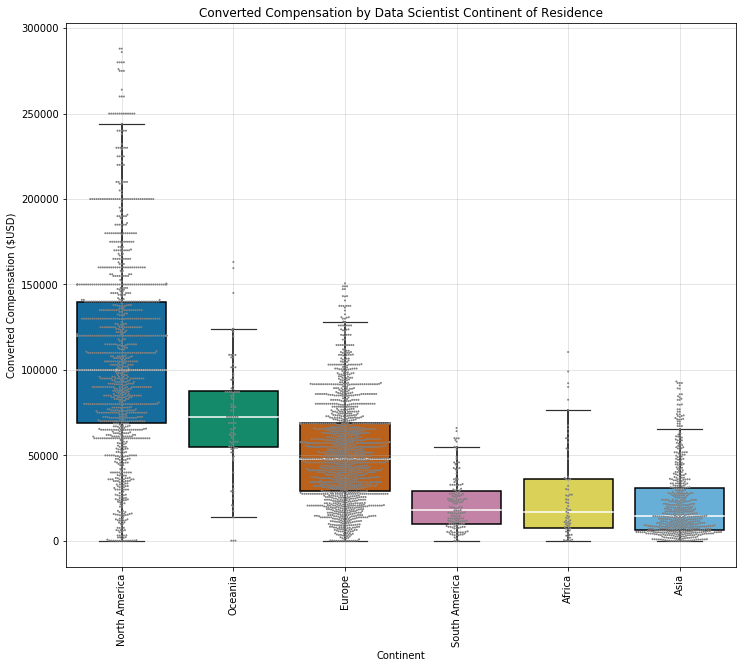

In [107]:
comp_cont_boxplot(cont_ds_ml_filtered)

### OBSERVATION 

- Europe and North America have 3188 resondents which is 76% of the respondents in the data frame.
- North America has the higest median salary for data scientist and also the biggest interquartile range.
- Africa has a median salary of 17000 and a wider interquartile range than South America and Asia. 

I will also like to dig deeper and see how countries in Africa fare in terms of compensation

In [108]:
# Create dataframe for data scientists from Africa
africa_ds_ml = ds_ml.query('Continent == "Africa"')
africa_ds_ml.head()

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
288,290,I code primarily as a hobby,Yes,Never,The quality of OSS and closed source software ...,"Independent contractor, freelancer, or self-em...",Egypt,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)","A natural science (ex. biology, chemistry, phy...","Taught yourself a new language, framework, or ...","Just me - I am a freelancer, sole proprietor, ...",Data scientist or machine learning specialist;...,1,30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,HTML/CSS;PHP;Python,R;Rust;Scala;SQL;Swift,SQLite,MongoDB;MySQL;Oracle;PostgreSQL,Windows,Android;Linux;Microsoft Azure,Django;Flask;Laravel,Angular/Angular.js;React.js;Vue.js,Pandas,NaN,Atom;IPython / Jupyter,Windows,I do not use containers,NaN,NaN,No,SIGH,Yes,Twitter,In real life (in person),UserID,2018,Multiple times per day,Find answers to specific questions;Get a sense...,More than 10 times per week,Stack Overflow was much faster,60+ minutes,Yes,A few times per week,"No, I didn't know that Stack Overflow had a jo...","No, and I don't know what those are","No, not at all",A lot less welcome now than last year,Tech articles written by other developers;Indu...,30.0,Man,No,Straight / Heterosexual,White or of European descent,Yes,Too long,Neither easy nor difficult,Africa,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
493,495,I code primarily as a hobby,Yes,Less than once a month but more than once per ...,"OSS is, on average, of HIGHER quality than pro...","Independent contractor, freelancer, or self-em...",Ghana,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken a part-time in-person course in programm...,"Just me - I am a freelancer, sole proprietor, ...",Data scientist or machine learning specialist,3,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,R,Python;R;SQL,PostgreSQL,PostgreSQL,Heroku,NaN,NaN,NaN,NaN,NaN,RStudio,Windows,"Outside of work, for personal projects",NaN,"Useful for decentralized currency (i.e., Bitcoin)",Yes,Yes,What?,Twitter,In real life (in person),Username,2016,A few times per month or weekly,Find answers to specific questions;Learn how t...,1-2 times per week,Stack Overflow was slightly faster,60+ minutes,Not sure / can't remember,NaN,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are",Neutral,J

In [109]:
# Get sum of null values in column
africa_ds_ml['ConvertedComp'].isnull().sum()

119

In [110]:
# Drop rows with Nan values in column 
africa_ds_ml = africa_ds_ml.dropna(subset=['ConvertedComp'], how='any')

# Confirm nan values have been dropped
africa_ds_ml['ConvertedComp'].isnull().sum()

0

In [111]:
# Create dataframe of the african country of residence and converted compensation of data scientist
africa_ds_comp = africa_ds_ml[['Country', 'ConvertedComp']]
africa_ds_comp

,Country,ConvertedComp
1887,South Africa,36027.0
2673,South Africa,18013.0
5228,South Africa,90066.0
6898,South Africa,76560.0
8080,Ethiopia,3576.0
8826,Tunisia,5256.0
9445,South Africa,36024.0
10360,Nigeria,11172.0
15556,Cameroon,60000.0
15748,Djibouti,18876.0


In [112]:
# Lets see how many countries with value counts in the df
africa_ds_comp.Country.value_counts()

South Africa                        31
Egypt                                8
Tunisia                              5
Nigeria                              4
Uganda                               4
Kenya                                4
Algeria                              3
United Republic of Tanzania          3
Cameroon                             2
Madagascar                           2
Mauritius                            2
Zimbabwe                             1
Democratic Republic of the Congo     1
Ghana                                1
Côte d'Ivoire                        1
Senegal                              1
Zambia                               1
Djibouti                             1
Ethiopia                             1
Name: Country, dtype: int64

In [113]:
# Create list of african countries
africa_list = set(list(africa_ds_ml['Country']))
africa_list

{'Algeria',
 'Cameroon',
 "Côte d'Ivoire",
 'Democratic Republic of the Congo',
 'Djibouti',
 'Egypt',
 'Ethiopia',
 'Ghana',
 'Kenya',
 'Madagascar',
 'Mauritius',
 'Nigeria',
 'Senegal',
 'South Africa',
 'Tunisia',
 'Uganda',
 'United Republic of Tanzania',
 'Zambia',
 'Zimbabwe'}

In [114]:
# For each country remove outliers based on Tukey method
africa_ds_ml_filtered = pd.DataFrame(columns=['Country','ConvertedComp','Median'])

# Create dictionary to store upper and lower outlier ranges for future analysis
tukey_ranges = {}
for country in africa_list:
    country_comp = africa_ds_comp[africa_ds_comp.Country==country]
    q3 = country_comp.ConvertedComp.quantile(q=0.75)
    q1 = country_comp.ConvertedComp.quantile(q=0.25)
    upper_limit = q3 + 1.5*(q3-q1)
    lower_limit = q1 - 1.5*(q3-q1)
    
    # Store upper and lower limits per country for future analysis
    tukey_ranges[country] ={'lower_limit':lower_limit, 'upper_limit':upper_limit}
    
    # Remove outliers based on the Tukey method
    outlier_mask = ((country_comp.ConvertedComp>upper_limit) | (country_comp.ConvertedComp<lower_limit))
    country_comp = country_comp[~outlier_mask]
    
    # Insert Median columns to help with sorting of country boxplots
    median_comp = country_comp.ConvertedComp.median()
    country_comp['Median'] = median_comp
    print(f'Median salary of {country} is ${round(median_comp)}')
    africa_ds_ml_filtered = africa_ds_ml_filtered.append(country_comp)

# Sort resulting dataframe by Median and display results
africa_ds_ml_filtered.sort_values(by='Median', ascending=False, inplace=True)

Median salary of Ethiopia is $3576.0
Median salary of Côte d'Ivoire is $14676.0
Median salary of South Africa is $35941.0
Median salary of Egypt is $8389.0
Median salary of Uganda is $14172.0
Median salary of United Republic of Tanzania is $2592.0
Median salary of Democratic Republic of the Congo is $110484.0
Median salary of Zimbabwe is $30000.0
Median salary of Kenya is $12540.0
Median salary of Tunisia is $5256.0
Median salary of Cameroon is $76110.0
Median salary of Mauritius is $12576.0
Median salary of Senegal is $62880.0
Median salary of Zambia is $400.0
Median salary of Nigeria is $9972.0
Median salary of Algeria is $20328.0
Median salary of Djibouti is $18876.0
Median salary of Madagascar is $1800.0
Median salary of Ghana is $1824.0


### OBSERVATION
- 40% of respondents coming from South Africa and other countries having just 1 or 2 respondents. This makes it hard to get meaningful insights about Data scientists compensation in the continent.

### Q7. How optimistic are Data Scientists about the future

In [115]:
print_question_text('BetterLife')

BetterLife: Do you think people born today will have a better life than their parents?



In [116]:
ds_ml_future = 100 * ds_ml.BetterLife.value_counts()/ds_ml.shape[0]
ds_ml_future

Yes    63.606811
No     34.256966
Name: BetterLife, dtype: float64

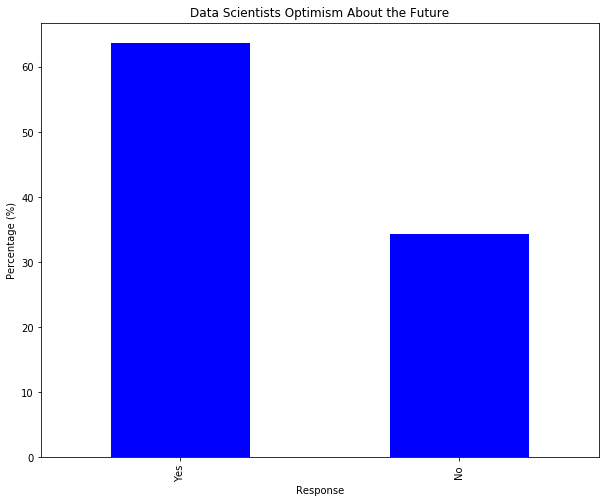

In [117]:
# Plot bar chart
plt.figure(figsize = [10, 8])
ds_ml_future.plot(kind="bar", color="blue")
plt.title('Data Scientists Optimism About the Future')
plt.xlabel('Response')
plt.ylabel('Percentage (%)');

### OBSERVATION
Data scientists are very optimistic about the future as 63.8% of respondents believe people born today will have a better life than their parents. Thats cool. 

### Q8. What is the nature of Data Scientists Employment

In [118]:
ds_employ = ds_ml.Employment.value_counts()
ds_employ

Employed full-time                                      4701
Independent contractor, freelancer, or self-employed     735
Not employed, but looking for work                       538
Employed part-time                                       486
Name: Employment, dtype: int64

In [119]:
ds_employ_perc = 100 * ds_employ / ds_ml.shape[0]
ds_employ_perc

Employed full-time                                      72.770898
Independent contractor, freelancer, or self-employed    11.377709
Not employed, but looking for work                       8.328173
Employed part-time                                       7.523220
Name: Employment, dtype: float64

### OBSERVATION

- 85.6% of Data Scientists respondents are in full time employment, 8.6% are freelancers and 5.8% are part time workers

## MODELING

### What are the best predictors for the compensation of a Data Scientist?

In [120]:
# Lets see the data types of the column
ds_ml.dtypes

Respondent                                         int64
MainBranch                                        object
Hobbyist                                          object
OpenSourcer                                       object
OpenSource                                        object
Employment                                        object
Country                                           object
Student                                           object
EdLevel                                           object
UndergradMajor                                    object
EduOther                                          object
OrgSize                                           object
DevType                                           object
YearsCode                                         object
Age1stCode                                        object
YearsCodePro                                      object
CareerSat                                         object
JobSat                         

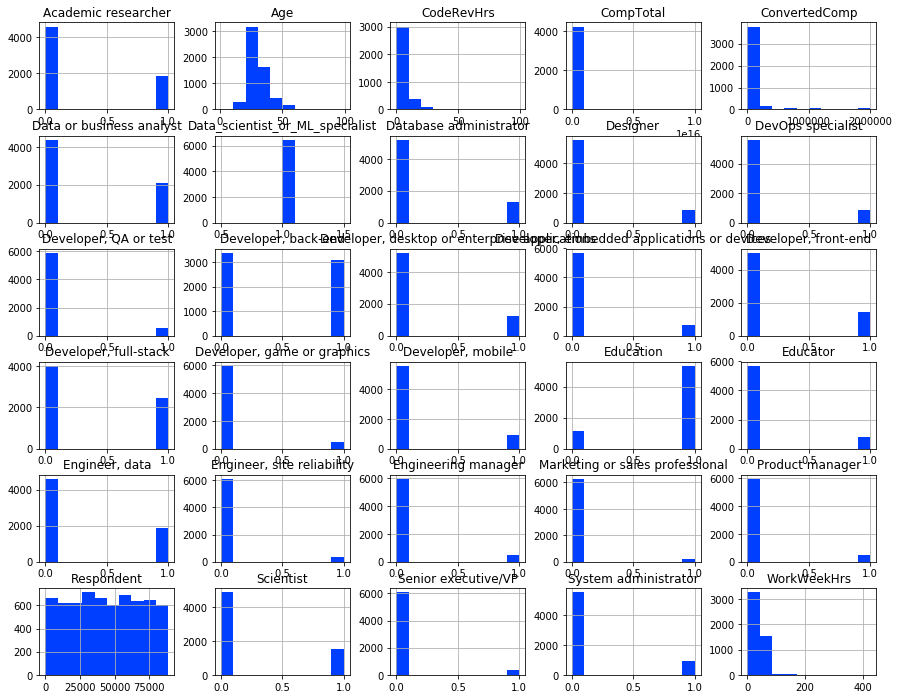

In [121]:
# Plot histograms
ds_ml.hist(figsize = [15, 12]);

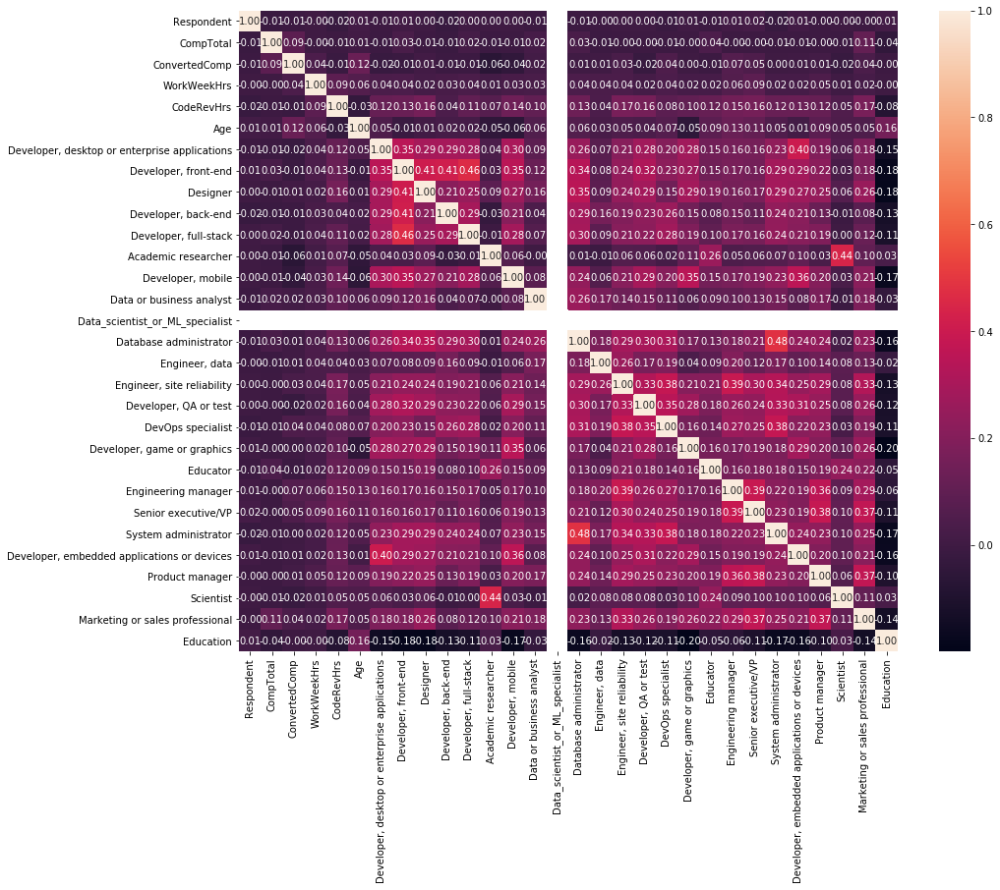

In [122]:
plt.figure(figsize = [15, 12])
sns.heatmap(ds_ml.corr(), annot=True, fmt='.2f');

In [123]:
# Create dataframe for categorical variables only
cat_ds_ml = ds_ml.select_dtypes(include=['object']) 

# Print how many categorical columns are in the dataframe - should be 147
cat_ds_ml.shape

(6460, 80)

In [124]:
cat_ds_ml.head(2)

,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompFreq,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent
5,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,Monthly,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America
9,I am a developer by profession,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,India,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)",NaN,NaN,"10,000 or more employees",Data or business analyst;Data scientist or mac...,12,20,10,Slightly dissatisfied,Slightly dissatisfied,Somewhat confident,Yes,Yes,"I’m not actively looking, but I am open to new...",3-4 years ago,NaN,No,"Languages, frameworks, and other technologies ...",NaN,INR,Indian rupee,Yearly,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,Far above average,"Yes, because I see value in code review","Yes, it's part of our process",NaN,NaN,C#;Go;JavaScript;Python;R;SQL,C#;Go;JavaScript;Kotlin;Python;R;SQL,Elasticsearch;MongoDB;Microsoft SQL Server;MyS...,Elasticsearch;MongoDB;Microsoft SQL Server,Linux;Windows,Android;Linux;Raspberry Pi;Windows,Angular/Angular.js;ASP.NET;Django;Express;Flas...,Angular/Angular.js;ASP.NET;Django;Express;Flas...,.NET;Node.js;Pandas;Torch/PyTorch,.NET;Node.js;TensorFlow;Torch/PyTorch,Android Studio;Eclipse;IPython / Jupyter;Notep...,Windows,NaN,Not at all,Useful for immutable record keeping outside of...,No,Yes,Yes,YouTube,Neither,Screen Name,NaN,Multiple times per day,Find answers to specific questions;Get a sense...,3-5 times per week,They were about the same,NaN,Yes,A few times per month or weekly,Yes,"No, and I don't kno

In [125]:
np.sum(np.sum(cat_ds_ml.isnull())/cat_ds_ml.shape[0] > .5)

0

In [126]:
dummy_ds_ml = ds_ml.copy()

In [127]:
#dummy_ds_ml = ds_ml.query('YearsCodePro == 1')
dummy_ds_ml.head()

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
5,6,"I am not primarily a developer, but I write co...",Yes,Never,The quality of OSS and closed source software ...,Employed full-time,Canada,No,"Bachelor’s degree (BA, BS, B.Eng., etc.)",Mathematics or statistics,Taken an online course in programming or softw...,NaN,Data or business analyst;Data scientist or mac...,13,15,3,Very satisfied,Slightly satisfied,Very confident,No,Yes,I am not interested in new job opportunities,1-2 years ago,Write any code;Complete a take-home project;In...,No,Financial performance or funding status of the...,I heard about a job opportunity (from a recrui...,CAD,Canadian dollar,40000.0,Monthly,366420.0,15.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,A little above average,No,NaN,"Yes, it's not part of our process but the deve...",Not sure,I have little or no influence,Java;R;SQL,Python;Scala;SQL,MongoDB;PostgreSQL,PostgreSQL,Android;Google Cloud Platform;Linux;Windows,Android;Google Cloud Platform;Linux;Windows,NaN,NaN,Hadoop,Hadoop;Pandas;TensorFlow;Unity 3D,Android Studio;Eclipse;PyCharm;RStudio;Visual ...,Windows,I do not use containers,Not at all,NaN,No,Yes,No,YouTube,In real life (in person),Login,2011,A few times per month or weekly,Find answers to specific questions,Less than once per week,Stack Overflow was slightly faster,60+ minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, and I don't know what those are","No, not really",Just as welcome now as I felt last year,Tech articles written by other developers;Indu...,28.0,Man,No,Straight / Heterosexual,East Asian,No,Too long,Neither easy nor difficult,North America,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
9,10,I am a developer by profession,Yes,Once a month or more often,"OSS is, on average, of HIGHER quality than pro...",Employed full-time,India,No,"Master’s degree (MA, MS, M.Eng., MBA, etc.)",NaN,NaN,"10,000 or more employees",Data or business analyst;Data scientist or mac...,12,20,10,Slightly dissatisfied,Slightly dissatisfied,Somewhat confident,Yes,Yes,"I’m not actively looking, but I am open to new...",3-4 years ago,NaN,No,"Languages, frameworks, and other technologies ...",NaN,INR,Indian rupee,950000.0,Yearly,13293.0,70.0,There's no schedule or spec; I work on what se...,NaN,A few days each month,Home,Far above average,"Yes, because I see value in code review",4.0,"Y

In [128]:
# #Drop columns with all NaN values
# dummy_ds_ml.dropna(inplace=True)


# #Split into explanatory and response variables
# X = dummy_ds_ml.drop(['WorkWeekHrs'], axis=1)
# y = dummy_ds_ml

# #Split into train and test
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=42)

# # Instantiate
# lm_model = LinearRegression(normalize=True) 
# # Fit
# lm_model.fit(X_train, y_train) 

# #Predict using your model
# y_test_preds = lm_model.predict(X_test)
# y_train_preds = lm_model.predict(X_train)

# #Score using your model
# test_score = r2_score(y_test, y_test_preds)
# train_score = r2_score(y_train, y_train_preds)




In [129]:
# Write function to find optimal linear model
def find_optimal_lm_mod(X, y, cutoffs, test_size = .30, random_state=42, plot=True):
    '''
    INPUT
    X - pandas dataframe, X matrix
    y - pandas dataframe, response variable
    cutoffs - list of ints, cutoff for number of non-zero values in dummy categorical vars
    test_size - float between 0 and 1, default 0.3, determines the proportion of data as test data
    random_state - int, default 42, controls random state for train_test_split
    plot - boolean, default 0.3, True to plot result

    OUTPUT
    r2_scores_test - list of floats of r2 scores on the test data
    r2_scores_train - list of floats of r2 scores on the train data
    lm_model - model object from sklearn
    X_train, X_test, y_train, y_test - output from sklearn train test split used for optimal model
    '''
    r2_scores_test, r2_scores_train, num_feats, results = [], [], [], dict()
    for cutoff in cutoffs:

        #reduce X matrix
        reduce_X = X.iloc[:, np.where((X.sum() > cutoff) == True)[0]]
        num_feats.append(reduce_X.shape[1])
        
        #split the data into train and test
        X_train, X_test, y_train, y_test = train_test_split(reduce_X, y, test_size = test_size, random_state=random_state)

        #fit the model and obtain pred response
        lm_model = LinearRegression(normalize=True)
        lm_model.fit(X_train, y_train)
        y_test_preds = lm_model.predict(X_test)
        y_train_preds = lm_model.predict(X_train)

        #append the r2 value from the test set
        r2_scores_test.append(r2_score(y_test, y_test_preds))
        r2_scores_train.append(r2_score(y_train, y_train_preds))
        results[str(cutoff)] = r2_score(y_test, y_test_preds)

    if plot:
        plt.plot(num_feats, r2_scores_test, label="Test", alpha=.5)
        plt.plot(num_feats, r2_scores_train, label="Train", alpha=.5)
        plt.xlabel('Number of Features')
        plt.ylabel('Rsquared')
        plt.title('Rsquared by Number of Features')
        plt.legend(loc=1)
        plt.show()

    best_cutoff = max(results, key=results.get)

    #reduce X matrix
    reduce_X = X.iloc[:, np.where((X.sum() > int(best_cutoff)) == True)[0]]
    num_feats.append(reduce_X.shape[1])

    #split the data into train and test
    X_train, X_test, y_train, y_test = train_test_split(reduce_X, y, test_size = test_size, random_state=random_state)

    #fit the model
    lm_model = LinearRegression(normalize=True)
    lm_model.fit(X_train, y_train)

    return r2_scores_test, r2_scores_train, lm_model, X_train, X_test, y_train, y_test

In [130]:
# Write function to clean data frame
def clean_data(df):
    '''
    INPUT
    df - pandas dataframe 
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    This function cleans df using the following steps to produce X and y:
    1. Drop all the rows with no salaries
    2. Create X as all the columns that are not the Converted compensation column
    3. Create y as the Converted compensation column
    4. Drop the Converted compensation and Respondent columns from X
    5. For each numeric variable in X, fill the column with the mean value of the column.
    6. Create dummy columns for all the categorical variables in X, drop the original columns
    '''
    # Drop rows with missing salary values
    df = df.dropna(subset=['ConvertedComp'], axis=0)
    y = df['ConvertedComp']
    
    #Drop respondent and expected salary columns
    df = df.drop(['Respondent', 'ConvertedComp'], axis=1)
    
    # Fill numeric columns with the mean
    # The numeric columns are alot fewer than the categorical column and the missing values are relatively small
    num_vars = df.select_dtypes(include=['float', 'int']).columns
    for col in num_vars:
        df[col].fillna((df[col].mean()), inplace=True)
        
    # Dummy the categorical variables
    cat_vars = df.select_dtypes(include=['object']).copy().columns
    for var in  cat_vars:
        # for each cat add dummy var, drop original column
        df = pd.concat([df.drop(var, axis=1), pd.get_dummies(df[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    
    X = df
    return X, y
      

### USING ALL DATA TO PREDICT CONVERTED COMPENSATION

In [131]:
#Use the function to create X and y
X, y = clean_data(dummy_ds_ml)

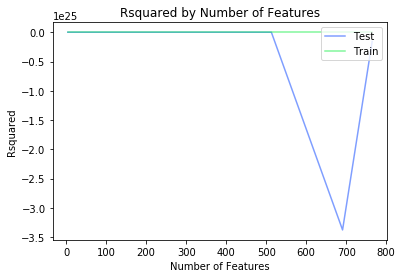

In [132]:
#cutoffs here pertains to the number of missing values allowed in the used columns.
#Therefore, lower values for the cutoff provides more predictors in the model.
cutoffs = [5000, 3500, 2500, 1000, 100, 50, 30, 25]

r2_scores_test, r2_scores_train, lm_model, X_train, X_test, y_train, y_test = find_optimal_lm_mod(X, y, cutoffs)

In [133]:
print(X_train.shape[1]) #Number of columns
print(r2_scores_test[np.argmax(r2_scores_test)]) # The model we should implement test_r2
print(r2_scores_train[np.argmax(r2_scores_test)]) # The model we should implement train_r2


338
0.233437490109
0.422456191647


In [134]:
def coef_weights(coefficients, X_train):
    '''
    INPUT:
    coefficients - the coefficients of the linear model 
    X_train - the training data, so the column names can be used
    OUTPUT:
    coefs_df - a dataframe holding the coefficient, estimate, and abs(estimate)
    
    Provides a dataframe that can be used to understand the most influential coefficients
    in a linear model by providing the coefficient estimates along with the name of the 
    variable attached to the coefficient.
    '''
    coefs_df = pd.DataFrame()
    coefs_df['est_int'] = X_train.columns
    coefs_df['coefs'] = lm_model.coef_
    coefs_df['abs_coefs'] = np.abs(lm_model.coef_)
    coefs_df = coefs_df.sort_values('abs_coefs', ascending=False)
    return coefs_df



In [135]:
#Use the function
coef_df = coef_weights(lm_model.coef_, X_train)



In [136]:
#A quick look at the top results
coef_df.head(20)

,est_int,coefs,abs_coefs
12,Data_scientist_or_ML_specialist,2.947626e+19,2.947626e+19
160,CurrencySymbol_CAD,9.035390e+18,9.035390e+18
166,CurrencyDesc_Canadian dollar,-9.035390e+18,9.035390e+18
159,CurrencySymbol_BRL,-5.280492e+18,5.280492e+18
165,CurrencyDesc_Brazilian real,5.280492e+18,5.280492e+18
170,CurrencyDesc_United States dollar,1.452858e+18,1.452858e+18
164,CurrencySymbol_USD,-1.452858e+18,1.452858e+18
167,CurrencyDesc_European Euro,9.946174e+17,9.946174e+17
161,CurrencySymbol_EUR,-9.946174e+17,9.946174e+17
168,CurrencyDesc_Indian rupee,7.501492e+17,7.501492e+17


### OBSERVATION 

The model is performing poorly

In [137]:
# # Assign X (features) and y (outcome), and dummify features
# # y = model_df.JobSat.values
# # X = model_df.drop(columns=['JobSat'])
# # X = pd.get_dummies(X, drop_first=True)

# #Use the function to create X and y
# X, y = clean_data(dummy_ds_ml)

# # Display resulting shape of predictors dataframe
# print(X.shape)

# # Split data in train and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [138]:
# # Instantiate RandomForestClassifier
# clf_rf = RandomForestClassifier(random_state=10)

# # Define hyperparameter grid
# param_grid = {'n_estimators':[10, 50, 75, 100, 200, 300, 500], 
#               'criterion':['gini', 'entropy'], 
#               'min_samples_split':[2, 3, 4], 
#               'max_depth':[20, None]}

# # Instantiate GridSearchCV object
# clf_rf_gs = GridSearchCV(clf_rf, param_grid, n_jobs=-1, cv=KFold(random_state=42, shuffle=True))

# # Fit GridSearchCV object to training data
# clf_rf_gs.fit(X_train, y_train)

# # Display the best mean cross validated score on the training data
# clf_rf_gs.best_score_

In [139]:
#ds_ml_remote = dummy_ds_ml.copy()

In [140]:
#Use the function to create X and y
#X, y = clean_data(dummy_ds_ml)

In [141]:
# # X = X
# # y = y
# X, y = clean_data(dummy_ds_ml)

# bestfeatures = SelectKBest(score_func=chi2, k=20)
# fit = bestfeatures.fit(X,y)

# df_scores = pd.DataFrame(fit.scores_)
# df_columns = pd.DataFrame(X.columns)

# #concat dfs
# featureScores = pd.concat([df_columns, df_scores], axis=1)

# # rename columns
# featureScores.columns = ['Specs', 'Score']

# print(featureScores.nlargest(20, 'Score'))


In [142]:
# X, y = clean_data(dummy_ds_ml)
# model = ExtraTreesClassifier()

# model.fit(X, y)
# print(model.feature_importances_)

# # Use inbuilt class feature importances of tree based classifiers

# # plot graph of feature importances 
# feat_importances = pd.Series(model.feature_importances_, index=X.columns)
# feat_importances.nlargest(20).plot(kind='barh');
# plt.show

In [143]:
#print_question_text('PurchaseWhat')

In [144]:
# plt.figure(figsize = [15, 12])
# X
# y

# sns.heatmap(dummy_ds_ml.corr(), annot=True, fmt='.2f');

## MODEL 2

In [145]:
# Create dataframe for data scientists just starting out
yr = ds_ml.query('YearsCodePro == "1" or YearsCodePro == "Less than 1 year"')
yr.head(3)

,Respondent,MainBranch,Hobbyist,OpenSourcer,OpenSource,Employment,Country,Student,EdLevel,UndergradMajor,EduOther,OrgSize,DevType,YearsCode,Age1stCode,YearsCodePro,CareerSat,JobSat,MgrIdiot,MgrMoney,MgrWant,JobSeek,LastHireDate,LastInt,FizzBuzz,JobFactors,ResumeUpdate,CurrencySymbol,CurrencyDesc,CompTotal,CompFreq,ConvertedComp,WorkWeekHrs,WorkPlan,WorkChallenge,WorkRemote,WorkLoc,ImpSyn,CodeRev,CodeRevHrs,UnitTests,PurchaseHow,PurchaseWhat,LanguageWorkedWith,LanguageDesireNextYear,DatabaseWorkedWith,DatabaseDesireNextYear,PlatformWorkedWith,PlatformDesireNextYear,WebFrameWorkedWith,WebFrameDesireNextYear,MiscTechWorkedWith,MiscTechDesireNextYear,DevEnviron,OpSys,Containers,BlockchainOrg,BlockchainIs,BetterLife,ITperson,OffOn,SocialMedia,Extraversion,ScreenName,SOVisit1st,SOVisitFreq,SOVisitTo,SOFindAnswer,SOTimeSaved,SOHowMuchTime,SOAccount,SOPartFreq,SOJobs,EntTeams,SOComm,WelcomeChange,SONewContent,Age,Gender,Trans,Sexuality,Ethnicity,Dependents,SurveyLength,SurveyEase,Continent,"Developer, desktop or enterprise applications","Developer, front-end",Designer,"Developer, back-end","Developer, full-stack",Academic researcher,"Developer, mobile",Data or business analyst,Data_scientist_or_ML_specialist,Database administrator,"Engineer, data","Engineer, site reliability","Developer, QA or test",DevOps specialist,"Developer, game or graphics",Educator,Engineering manager,Senior executive/VP,System administrator,"Developer, embedded applications or devices",Product manager,Scientist,Marketing or sales professional,Education
61,62,I am a developer by profession,Yes,Less than once a month but more than once per ...,"OSS is, on average, of LOWER quality than prop...",Employed full-time,Netherlands,1,Associate degree,"Computer science, computer engineering, or sof...",Taken an online course in programming or softw...,"10,000 or more employees",Data or business analyst;Data scientist or mac...,1,11,1,Very satisfied,Slightly dissatisfied,Not at all confident,No,Yes,"I’m not actively looking, but I am open to new...",1-2 years ago,"Write any code;Write code by hand (e.g., on a ...",No,Remote work options;Opportunities for professi...,"Something else changed (education, award, medi...",EUR,European Euro,76800.0,Yearly,87994.0,45.0,There is a schedule and/or spec (made by me or...,Inadequate access to necessary tools;Lack of s...,Less than once per month / Never,Home,Far above average,"Yes, because I see value in code review",10.0,"Yes, it's not part of our process but the deve...",NaN,I have some influence,Bash/Shell/PowerShell;C++;Go;HTML/CSS;Java;Jav...,Bash/Shell/PowerShell;C;C++;C#;HTML/CSS;Java;J...,MariaDB;Microsoft SQL Server;MySQL;Oracle;Post...,MariaDB;MySQL;Oracle;PostgreSQL;SQLite,Android;Linux;MacOS;Microsoft Azure;Raspberry ...,Android;Docker;Google Cloud Platform;Heroku;iO...,Django;jQuery;React.js,ASP.NET;Django;Laravel;React.js,.NET;Node.js;React Native,.NET;Node.js;React Native,Atom;NetBeans;Notepad++;PHPStorm;PyCharm;Subli...,Windows,Testing,NaN,A passing fad,Yes,Yes,Yes,Reddit,In real life (in person),Username,2013,A few times per week,Find answers to specific questions;Contribute ...,1-2 times per week,The other resource was slightly faster,31-60 minutes,Yes,I have never participated in Q&A on Stack Over...,"No, I knew that Stack Overflow had a job board...","No, I've heard of them, but I am not part of a...","Yes, somewhat",A lot less welcome now than last year,Tech articles written by other developers;Indu...,19.0,Man,No,Straight / Heterosexual,White or of European descent,No,Appropriate in length,Easy,Europe,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0
515,517,"I am not primarily a developer, but I write co...",No,Less than once per year,The quality of OSS and closed source software ...,"Not employed, but looking for work",United States,"Yes, part-time",Associate degree,"Another engineering discipline (ex. civil, ele...",Participated in a full-time developer training..

In [146]:
# Write function to clean data frame
def clean_data(df):
    '''
    INPUT
    df - pandas dataframe 
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    This function cleans df using the following steps to produce X and y:
    1. Drop all the rows with no salaries
    2. Create X as all the columns that are not the Converted compensation column
    3. Create y as the Converted compensation column
    4. Drop the Converted compensation and Respondent columns from X
    5. For each numeric variable in X, fill the column with the mean value of the column.
    6. Create dummy columns for all the categorical variables in X, drop the original columns
    '''
    # Drop rows with missing salary values
    df = df.dropna(subset=['ConvertedComp'], axis=0)
    y = df['ConvertedComp']
    
    #Drop respondent and expected salary columns
    df = df.drop(['Respondent', 'ConvertedComp'], axis=1)
    
    # Fill numeric columns with the mean
    num_vars = df.select_dtypes(include=['float', 'int']).columns
    for col in num_vars:
        df[col].fillna((df[col].mean()), inplace=True)
        
    # Dummy the categorical variables
    cat_vars = df.select_dtypes(include=['object']).copy().columns
    for var in  cat_vars:
        # for each cat add dummy var, drop original column
        df = pd.concat([df.drop(var, axis=1), pd.get_dummies(df[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    
    X = df
    return X, y
      

In [147]:
# # Subset df to only those with Education of 1
# remote_ds_ml = ds_ml[ds_ml['WorkRemote'] == "All or almost all the time (I'm full-time remote)"]
# remote_ds_ml.head(3)

In [148]:
# X = X
# y = y
X, y = clean_data(yr)

bestfeatures = SelectKBest(score_func=chi2, k=20)
fit = bestfeatures.fit(X,y)

df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X.columns)

#concat dfs
featureScores = pd.concat([df_columns, df_scores], axis=1)

# rename columns
featureScores.columns = ['Specs', 'Score']

print(featureScores.nlargest(20, 'Score'))


                                                  Specs         Score
0                                             CompTotal  4.081818e+17
1                                           WorkWeekHrs  4.922504e+03
2                                            CodeRevHrs  2.990158e+03
264   DevType_Academic researcher;Data or business a...  4.590000e+02
603   JobFactors_Financial performance or funding st...  4.590000e+02
1413     LanguageDesireNextYear_C++;Go;Python;Scala;SQL  4.590000e+02
1907  PlatformWorkedWith_AWS;Google Cloud Platform;K...  4.590000e+02
2049  PlatformWorkedWith_Docker;Linux;Microsoft Azur...  4.590000e+02
2329  PlatformDesireNextYear_Docker;Linux;Microsoft ...  4.590000e+02
2342  PlatformDesireNextYear_Google Cloud Platform;K...  4.590000e+02
2963  DevEnviron_Atom;IPython / Jupyter;PyCharm;Subl...  4.590000e+02
296   DevType_Academic researcher;Data scientist or ...  4.590000e+02
832   WorkChallenge_Being tasked with non-developmen...  4.590000e+02
952   LanguageWorked

[ 0.00847549  0.00494794  0.00461913 ...,  0.00293569  0.0004368   0.0002184 ]


<function matplotlib.pyplot.show(*args, **kw)>

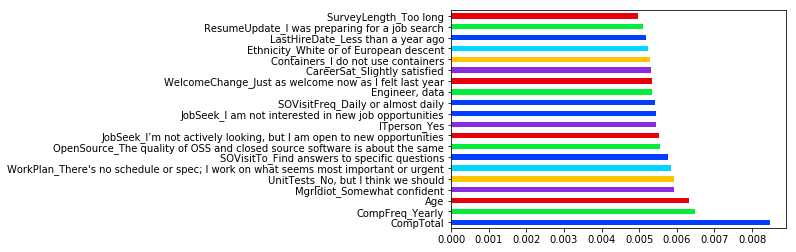

In [149]:
X, y = clean_data(yr)
model = ExtraTreesClassifier()

model.fit(X, y)
print(model.feature_importances_)

# Use inbuilt class feature importances of tree based classifiers

# plot graph of feature importances 
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh');
plt.show

In [150]:
#     df = df[['SOJobs', 'CompTotal', 'UnitTests', 'WorkWeekHrs', 'BetterLife', 'CodeRev', 'CompFreq',
#              'WorkRemote', 'EdLevel', 'Age', 'ConvertedComp']]

In [151]:
# ['CompTotal', 'WorkWeekHrs', 'CodeRevHrs', 'PlatformWorkedWith', 'LanguageDesireNextYear', 'PlatformDesireNextYear'
# 'CompFreq', 'JobSeek', 'Age', 'LastHireDate', 'WelcomeChange', 'WorkPlan', 'WorkLoc', 'EdLevel'] + rol_cols + lang_cols

### USING FEATURES FROM KBEST AND EXTRA TREES CLASSIFIER TO SELECT FEATURES

In [152]:
# Write function to clean data frame
def clean_data(df):
    '''
    INPUT
    df - pandas dataframe 
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    This function cleans df using the following steps to produce X and y:
    1. Drop all the rows with no salaries
    2. Create X as all the columns that are not the Converted compensation column
    3. Create y as the Converted compensation column
    4. Drop the Converted compensation and Respondent columns from X
    5. For each numeric variable in X, fill the column with the mean value of the column.
    6. Create dummy columns for all the categorical variables in X, drop the original columns
'''
# df = df[[ 'CodeRevHrs', 'PlatformWorkedWith', 'LanguageDesireNextYear', 'PlatformDesireNextYear',
#         'LanguageWorkedWith', 'JobFactors', 'WorkChallenge', 'ConvertedComp']]    
    # Drop rows with missing salary values
    df = df[['SOJobs', 'CompTotal', 'UnitTests', 'WorkWeekHrs', 'BetterLife', 'CodeRev', 'CompFreq', 'CodeRevHrs', 'PlatformWorkedWith', 
             'WorkRemote', 'EdLevel', 'Age', 'ConvertedComp', 'LanguageDesireNextYear', 'PlatformDesireNextYear', 'JobFactors',
            'WorkPlan']]
#     df = df[['CompTotal', 'WorkWeekHrs', 'CodeRevHrs', 'PlatformWorkedWith', 'LanguageDesireNextYear', 'PlatformDesireNextYear',
#               'LanguageWorkedWith', 'DevType', 'WorkRemote', 'JobFactors', 'UndergradMajor', 'WorkChallenge',
#          'CompFreq', 'JobSeek', 'Age', 'WelcomeChange', 'WorkPlan', 'WorkLoc', 'EdLevel', 'ConvertedComp']] #+ rol_cols #+ lang_cols
    df = df.dropna(subset=['ConvertedComp'], axis=0)
    y = df['ConvertedComp']
    
    #Drop respondent and expected salary columns
    df = df.drop(['ConvertedComp'], axis=1)
    
    # Fill numeric columns with the mean
    num_vars = df.select_dtypes(include=['float', 'int']).columns
    for col in num_vars:
        df[col].fillna((df[col].mean()), inplace=True)
        
    # Dummy the categorical variables
    cat_vars = df.select_dtypes(include=['object']).copy().columns
    for var in  cat_vars:
        # for each cat add dummy var, drop original column
        df = pd.concat([df.drop(var, axis=1), pd.get_dummies(df[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    
    X = df
    return X, y
    

In [153]:
#Use the function to create X and y
X, y = clean_data(yr)

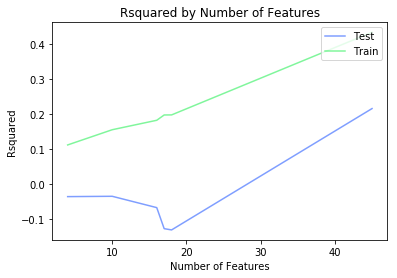

In [154]:
#cutoffs here pertains to the number of missing values allowed in the used columns.
#Therefore, lower values for the cutoff provides more predictors in the model.
#cutoffs = [5000, 3500, 2500, 1000, 100, 50, 30, 25]
cutoffs = [1000, 500, 300, 200, 100, 75, 50, 10]
r2_scores_test, r2_scores_train, lm_model, X_train, X_test, y_train, y_test = find_optimal_lm_mod(X, y, cutoffs)

In [155]:
print(X_train.shape[1]) #Number of columns
print(r2_scores_test[np.argmax(r2_scores_test)]) # The model we should implement test_r2
print(r2_scores_train[np.argmax(r2_scores_test)]) # The model we should implement train_r2


45
0.216638819859
0.434877565661


In [156]:
#Use the function
coef_df = coef_weights(lm_model.coef_, X_train)



In [157]:
#A quick look at the top results
coef_df.head(20)

,est_int,coefs,abs_coefs
12,CompFreq_Weekly,747165.922690,747165.922690
24,"EdLevel_Other doctoral degree (Ph.D, Ed.D., etc.)",159869.723393,159869.723393
40,"JobFactors_Languages, frameworks, and other te...",-158541.767655,158541.767655
7,"UnitTests_Yes, it's not part of our process bu...",-139771.151406,139771.151406
6,"UnitTests_No, but I think we should",-126804.413491,126804.413491
34,JobFactors_Industry that I'd be working in;Opp...,-122436.657050,122436.657050
27,LanguageDesireNextYear_Python,-113709.219017,113709.219017
18,WorkRemote_All or almost all the time (I'm ful...,-107433.089347,107433.089347
17,WorkRemote_About half the time,95803.002889,95803.002889
38,"JobFactors_Languages, frameworks, and other te...",-94056.393609,94056.393609


### USE OTHER SELECTORS TO SELECT FEATURES TO PREDICT CONVERTED COMPENSATION

In [158]:
# Write function to clean data frame
def clean_data(df):
    '''
    INPUT
    df - pandas dataframe 
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    This function cleans df using the following steps to produce X and y:
    1. Drop all the rows with no salaries
    2. Create X as all the columns that are not the Converted compensation column
    3. Create y as the Converted compensation column
    4. Drop the Converted compensation and Respondent columns from X
    5. For each numeric variable in X, fill the column with the mean value of the column.
    6. Create dummy columns for all the categorical variables in X, drop the original columns
    '''
    # Drop rows with missing salary values
    df = df.dropna(subset=['ConvertedComp'], axis=0)
    y = df['ConvertedComp']
    
    #Drop respondent and expected salary columns
    df = df.drop(['Respondent', 'ConvertedComp'], axis=1)
    
    # Fill numeric columns with the mean
    num_vars = df.select_dtypes(include=['float', 'int']).columns
    for col in num_vars:
        df[col].fillna((df[col].mean()), inplace=True)
        
    # Dummy the categorical variables
    cat_vars = df.select_dtypes(include=['object']).copy().columns
    for var in  cat_vars:
        # for each cat add dummy var, drop original column
        df = pd.concat([df.drop(var, axis=1), pd.get_dummies(df[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    
    X = df
    return X, y
    

In [159]:
#Use the function to create X and y
X, y = clean_data(ds_ml)
num_feats = 20

In [160]:
# Find top 20 correlated variables with converted compensation
def cor_selector(X, y,num_feats):
    cor_list = []
    feature_name = X.columns.tolist()
    # calculate the correlation with y for each feature
    for i in X.columns.tolist():
        cor = np.corrcoef(X[i], y)[0, 1]
        cor_list.append(cor)
    # replace NaN with 0
    cor_list = [0 if np.isnan(i) else i for i in cor_list]
    # feature name
    cor_feature = X.iloc[:,np.argsort(np.abs(cor_list))[-num_feats:]].columns.tolist()
    # feature selection? 0 for not select, 1 for select
    cor_support = [True if i in cor_feature else False for i in feature_name]
    return cor_support, cor_feature
cor_support, cor_feature = cor_selector(X, y,num_feats)
print(str(len(cor_feature)), 'selected features')

/opt/conda/lib/python3.6/site-packages/numpy/lib/function_base.py:3003: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/opt/conda/lib/python3.6/site-packages/numpy/lib/function_base.py:3004: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


20 selected features


In [161]:
# Select top 20 using KBest
X_norm = MinMaxScaler().fit_transform(X)
chi_selector = SelectKBest(chi2, k=20)
chi_selector.fit(X_norm, y)
chi_support = chi_selector.get_support()
chi_feature = X.loc[:,chi_support].columns.tolist()
print(str(len(chi_feature)), 'selected features')

20 selected features


In [162]:
# rfe_selector = RFE(estimator=LogisticRegression(), n_features_to_select=num_feats, step=100, verbose=5)
# rfe_selector.fit(X_norm, y)
# rfe_support = rfe_selector.get_support()
# rfe_feature = X.loc[:,rfe_support].columns.tolist()
# print(str(len(rfe_feature)), 'selected features')


In [163]:
embeded_lr_selector = SelectFromModel(LogisticRegression(penalty="l1"), num_feats)
embeded_lr_selector.fit(X_norm, y)

embeded_lr_support = embeded_lr_selector.get_support()
embeded_lr_feature = X.loc[:,embeded_lr_support].columns.tolist()
print(str(len(embeded_lr_feature)), 'selected features')

97 selected features


In [164]:
embeded_rf_selector = SelectFromModel(RandomForestClassifier(n_estimators=100), num_feats)
embeded_rf_selector.fit(X, y)

embeded_rf_support = embeded_rf_selector.get_support()
embeded_rf_feature = X.loc[:,embeded_rf_support].columns.tolist()
print(str(len(embeded_rf_feature)), 'selected features')

0 selected features


In [165]:
feature_name = X.columns.tolist()

In [166]:
# put all selection together
feature_selection_df = pd.DataFrame({'Feature':feature_name, 'Pearson':cor_support, 'Chi-2':chi_support, 'Logistics':embeded_lr_support,
                                    'Random Forest':embeded_rf_support})
# count the selected times for each feature
feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
# display the top 100
feature_selection_df = feature_selection_df.sort_values(['Total','Feature'] , ascending=False)
feature_selection_df.index = range(1, len(feature_selection_df)+1)
feature_selection_df.head(num_feats)

,Feature,Pearson,Chi-2,Logistics,Random Forest,Total
1,Student_No,True,False,True,False,2
2,CurrencySymbol_USD,True,False,True,False,2
3,CurrencyDesc_United States dollar,True,False,True,False,2
4,Country_United States,True,False,True,False,2
5,Continent_Europe,True,False,True,False,2
6,CompFreq_Yearly,True,False,True,False,2
7,WorkRemote_Less than once per month / Never,False,False,True,False,1
8,WorkPlan_There's no schedule or spec; I work o...,False,False,True,False,1
9,WorkPlan_There is a schedule and/or spec (made...,False,False,True,False,1
10,WorkLoc_Office,False,False,True,False,1


In [167]:
# # put all selection together
# feature_selection_df = pd.DataFrame({'Feature':feature_name, 'Pearson':cor_support, 'Chi-2':chi_support, 'RFE':rfe_support, 'Logistics':embeded_lr_support,
#                                     'Random Forest':embeded_rf_support})
# # count the selected times for each feature
# feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
# # display the top 100
# feature_selection_df = feature_selection_df.sort_values(['Total','Feature'] , ascending=False)
# feature_selection_df.index = range(1, len(feature_selection_df)+1)
# feature_selection_df.head(num_feats)

In [168]:
# X = ds_ml[['WorkLoc', 'WelcomeChange', 'SurveyEase', 'Sexuality', 'ScreenName', 'SOAccount', 'OffOn', 'LastHireDate',
#            'JobSeek', 'Hobbyist', 'EntTeams', 'Education', 'BetterLife']]
# #X = yr[['WorkLoc_Office', 'SurveyEase_Easy', 'Sexuality_Straight / Heterosexual','ScreenName_Username', 'SOAccount_Yes', 
#          #'OffOn_Yes', 'LastHireDate_Less than a year ago', 'Hobbyist_Yes', 'Education', 'BetterLife_Yes']]
# y = ds_ml[['ConvertedComp']]



In [169]:
# Write function to clean data frame
def clean_data(df):
    '''
    INPUT
    df - pandas dataframe 
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    This function cleans df using the following steps to produce X and y:
    1. Drop all the rows with no salaries
    2. Create X as all the columns that are not the Converted compensation column
    3. Create y as the Converted compensation column
    4. Drop the Converted compensation and Respondent columns from X
    5. For each numeric variable in X, fill the column with the mean value of the column.
    6. Create dummy columns for all the categorical variables in X, drop the original columns
    '''
    df = df[['WorkLoc', 'WelcomeChange', 'SurveyEase', 'Sexuality', 'ScreenName', 'SOAccount', 'OffOn', 'LastHireDate',
           'JobSeek', 'Hobbyist', 'EntTeams', 'Education', 'BetterLife', 'ConvertedComp',
            'SOJobs', 'CompTotal', 'UnitTests', 'WorkWeekHrs', 'CodeRev', 'CompFreq', 'CodeRevHrs', 'PlatformWorkedWith', 
              'WorkRemote', 'EdLevel', 'Age', 'LanguageDesireNextYear', 'PlatformDesireNextYear', 'JobFactors',
            'WorkPlan', 'Country', 'Continent']]
 
    # Drop rows with missing salary values
    
    df = df.dropna(subset=['ConvertedComp'], axis=0)
    y = df['ConvertedComp']
    
    #Drop respondent and expected salary columns
    df = df.drop(['ConvertedComp'], axis=1)
    
    # Fill numeric columns with the mean
    num_vars = df.select_dtypes(include=['float', 'int']).columns
    for col in num_vars:
        df[col].fillna((df[col].mean()), inplace=True)
        
    # Dummy the categorical variables
    cat_vars = df.select_dtypes(include=['object']).copy().columns
    for var in  cat_vars:
        # for each cat add dummy var, drop original column
        df = pd.concat([df.drop(var, axis=1), pd.get_dummies(df[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    
    X = df
    return X, y
    

In [170]:
X, y = clean_data(ds_ml)

In [171]:
#     df = df[['SOJobs', 'CompTotal', 'UnitTests', 'WorkWeekHrs', 'CodeRev', 'CompFreq', 'CodeRevHrs', 'PlatformWorkedWith', 
#              'WorkRemote', 'EdLevel', 'Age', 'LanguageDesireNextYear', 'PlatformDesireNextYear', 'JobFactors',
#             'WorkPlan']]

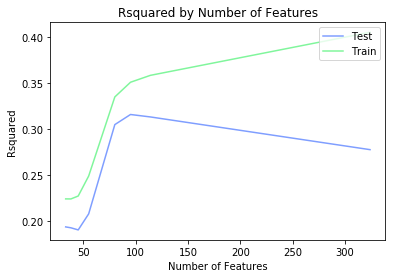

In [172]:
#cutoffs here pertains to the number of missing values allowed in the used columns.
#Therefore, lower values for the cutoff provides more predictors in the model.
#cutoffs = [5000, 3500, 2500, 1000, 100, 50, 30, 25]
cutoffs = [1000, 500, 300, 200, 100, 75, 50, 10]
r2_scores_test, r2_scores_train, lm_model, X_train, X_test, y_train, y_test = find_optimal_lm_mod(X, y, cutoffs)

In [173]:
#X, y = clean_data(yr)

In [174]:
print(X_train.shape[1]) #Number of columns
print(r2_scores_test[np.argmax(r2_scores_test)]) # The model we should implement test_r2
print(r2_scores_train[np.argmax(r2_scores_test)]) # The model we should implement train_r2


95
0.315858133492
0.350907903559


### OBSERVATION
All the models I have tried are not producing good results. I will appreciate help from the reviewer on how to improve my models.